In [126]:
import pandas as pd
import seaborn as sns
import statsmodels.api as sm 
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector
from mlxtend.regressor import LinearRegression
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [127]:
# Read in data
houses_train = pd.read_csv('train.csv', index_col = 'Id')
houses_test = pd.read_csv('test.csv', index_col = 'Id')
houses_train.head()
houses_test.head()

# combine the two
houses = pd.concat([houses_train, houses_test])
houses

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0
6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732.0,Unf,0.0,64.0,796.0,GasA,Ex,Y,SBrkr,796,566,0,1362,1.0,0.0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2.0,480.0,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000.0
7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369.0,Unf,0.0,317.0,1686.0,GasA,Ex,Y,SBrkr,1694,0,0,1694,1.0,0.0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2.0,636.0,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000.0
8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859.0,BLQ,32.0,216.0,1107.0,GasA,Ex,Y,SBrkr,1107,983,0,2090,1.0,0.0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2.0,484.0,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000.0
9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0.0,Unf,0.0,952.0,952.0,GasA,Gd,Y,FuseF,1022,752,0,1774,0.0,0.0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2.0,468.0,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,Na

Initial Data Cleaning

In [128]:
# MSSubClass Cleaning 
# Check missing values
print(houses['MSSubClass'].isna().sum())
# 0 NAs
# treat the variable as categorical due to the numbers reported discretely 
houses['MSSubClass'] = houses['MSSubClass'].astype('category')
houses['MSSubClass'].value_counts()


# Combine levels together - that make sense
houses['MSSubClass'] = houses['MSSubClass'].apply(lambda x: '120' if x in [120, 150] else x)
# 120 and 150 are similar so combine them
houses['MSSubClass'] = houses['MSSubClass'].apply(lambda x: '50' if x in [40, 50] else x)
# categories 40 and 50 are similar to each other, so makes sense to combine them
houses['MSSubClass'] = houses['MSSubClass'].apply(lambda x: '80' if x in [80, 85] else x)
# Categories 80 and 85 are similar to each other, so combine the levels
houses['MSSubClass'].value_counts()

0


20     1079
60      575
50      293
120     183
80      166
30      139
70      128
160     128
90      109
190      61
75       23
45       18
180      17
Name: MSSubClass, dtype: int64

In [129]:
# MSZoning - cleaning 
print(houses['MSZoning'].isna().sum())
# 4 NAs in combined train and test data
houses['MSZoning'] = houses['MSZoning'].fillna('RL')
houses['MSZoning'].value_counts()


4


RL         2269
RM          460
FV          139
RH           26
C (all)      25
Name: MSZoning, dtype: int64

In [130]:
# LotFrontage - data cleaning
print(houses['LotFrontage'].isna().sum())
# 486 NAs - replace with mean
houses['LotFrontage'] = houses['LotFrontage'].fillna(houses['LotFrontage'].mean())
houses['LotFrontage'].describe()
# upper_quartile_LotFrontage = houses['LotFrontage'].quantile(0.75)
# lower_quartile_LotFrontage = houses['LotFrontage'].quantile(0.25)
# LotFrontage_IQR = upper_quartile_LotFrontage - lower_quartile_LotFrontage

# upper_threshold_LotFrontage = upper_quartile_LotFrontage + 3 * LotFrontage_IQR
# lower_threshold_LotFrontage = lower_quartile_LotFrontage - 3 * LotFrontage_IQR

# # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses.LotFrontage > upper_threshold_LotFrontage, "LotFrontage"] = houses['LotFrontage'].mean()
# houses.loc[houses.LotFrontage < lower_threshold_LotFrontage, "LotFrontage"] = houses['LotFrontage'].mean()

# # Check skewness
stats.skew(houses['LotFrontage'])
# 1.645 skewness


486


1.6455737855221888

In [131]:
# LotArea
print(houses['LotArea'].isna().sum())
# 0 NAs
houses['LotArea'].describe()
# # Handling with outliers 
# upper_quartile_LotArea = houses['LotArea'].quantile(0.75)
# lower_quartile_LotArea = houses['LotArea'].quantile(0.25)
# LotArea_IQR = upper_quartile_LotArea - lower_quartile_LotArea

# upper_threshold_LotArea = upper_quartile_LotArea + 3 * LotArea_IQR
# lower_threshold_LotArea = lower_quartile_LotArea - 3 * LotArea_IQR

# # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses.LotArea > upper_threshold_LotArea, "LotArea"] = houses['LotArea'].mean()
# houses.loc[houses.LotArea < lower_threshold_LotArea, "LotArea"] = houses['LotArea'].mean()

# Check skewness
stats.skew(houses['LotArea'])
# skewness is 12.822 so we need to transform the variable to reduce it to at most 0.1


0


12.822431401556724

In [132]:
# Street 
print(houses['Street'].isna().sum())
# 0 NAs
houses['Street'].value_counts()
# No combining values required
# Since the Data only specifies only 12 non-pavement data points, this variable would be removed for the modeling stage
houses = houses.drop('Street', axis = 'columns')

0


In [133]:
# Alley
print(houses['Alley'].isna().sum())
# 2721 NAs - replace with not specified
houses['Alley'] = houses['Alley'].fillna('No alley access')
houses['Alley'].value_counts()



2721


No alley access    2721
Grvl                120
Pave                 78
Name: Alley, dtype: int64

In [134]:
# LotShape 
print(houses['LotShape'].isna().sum())
# 0 NAs
houses['LotShape'].value_counts()


0


Reg    1859
IR1     968
IR2      76
IR3      16
Name: LotShape, dtype: int64

In [135]:
# LandContour
print(houses['LandContour'].isna().sum())
# 0 NAs
houses['LandContour'].value_counts()
# No cleaning required

0


Lvl    2622
HLS     120
Bnk     117
Low      60
Name: LandContour, dtype: int64

In [136]:
# Utilities
print(houses['Utilities'].isna().sum())
# 2 NAs
houses['Utilities'] = houses['Utilities'].fillna('AllPub')
houses['Utilities'].value_counts()
# # Since there are only three variables that fall in categories other than AllPub, this variable would be removed from modeling
# houses = houses.drop('Utilities', axis = 'columns')

2


AllPub    2918
NoSeWa       1
Name: Utilities, dtype: int64

In [137]:
# LotConfig 
print(houses['LotConfig'].isna().sum())
# 0 NAs
houses['LotConfig'].value_counts()
# # Due to FR2 and FR3 being similar, I am combining these two levels
# houses['LotConfig'] = houses['LotConfig'].apply(lambda x: 'FR' if x in ['FR2', 'FR3'] else x)
# houses['LotConfig'].value_counts()

0


Inside     2133
Corner      511
CulDSac     176
FR2          85
FR3          14
Name: LotConfig, dtype: int64

In [138]:
# LandSlope 
print(houses['LandSlope'].isna().sum())
# 0 NAs - no data cleaning required
houses['LandSlope'].value_counts()
# # Since the Gtl category accounts for 95% of the data, this variable is irrelevant to the model. So drop the variable.
# houses = houses.drop('LandSlope', axis = 'columns')

0


Gtl    2778
Mod     125
Sev      16
Name: LandSlope, dtype: int64

In [139]:
# Neighborhood
print(houses['Neighborhood'].isna().sum())
# 0 NAs
houses['Neighborhood'].value_counts()
# No cleaning required

0


NAmes      443
CollgCr    267
OldTown    239
Edwards    194
Somerst    182
NridgHt    166
Gilbert    165
Sawyer     151
NWAmes     131
SawyerW    125
Mitchel    114
BrkSide    108
Crawfor    103
IDOTRR      93
Timber      72
NoRidge     71
StoneBr     51
SWISU       48
ClearCr     44
MeadowV     37
BrDale      30
Blmngtn     28
Veenker     24
NPkVill     23
Blueste     10
Name: Neighborhood, dtype: int64

In [140]:
# Condition1 
print(houses['Condition1'].isna().sum())
# 0 NAs
houses['Condition1'].value_counts()
# Combine levels 
houses['Condition1'] = houses['Condition1'].apply(lambda x: 'RRN' if x in ['RRNe', 'RRNn'] else x)
houses['Condition1'] = houses['Condition1'].apply(lambda x: 'RRA' if x in ['RRAe', 'RRAn'] else x)
houses['Condition1'] = houses['Condition1'].apply(lambda x: 'Pos' if x in ['PosA', 'PosN'] else x)
# # Since the Normal category accounts for 87.5% of the data, this variable will be irrelevant when predicting SalePrices. So drop this variable
# TODO: Maybe combine levels or with Condition2

0


In [141]:
# Condition2
print(houses['Condition2'].isna().sum())
# 0 NAs
houses['Condition2'].value_counts()
# # Since only a few variables are only small categories, we are removing condition 2
houses['Condition2'] = houses['Condition2'].apply(lambda x: 'RRN' if x in ['RRNe', 'RRNn'] else x)
houses['Condition2'] = houses['Condition2'].apply(lambda x: 'RRA' if x in ['RRAe', 'RRAn'] else x)
houses['Condition2'] = houses['Condition2'].apply(lambda x: 'Pos' if x in ['PosA', 'PosN'] else x)
# TODO: Combine Condition1 and Condition2 into is_A columns like is_nearRailroad.
all_conditions = set(houses['Condition1'].astype('category').cat.categories).union(set(houses['Condition2'].astype('category').cat.categories))
for condition in all_conditions:
    houses['Condition_' + condition] = houses.apply(lambda x: 1 if condition in {x['Condition1'], x['Condition2']} else 0, axis = 1)

0


In [142]:
for condition in all_conditions:
    print(houses['Condition_' + condition].value_counts())
# Combine variables
# Drop Condition1 and Condition2
houses = houses.drop('Condition1', axis = 'columns')
houses = houses.drop('Condition2', axis = 'columns')

0    2839
1      80
Name: Condition_RRA, dtype: int64
1    2889
0      30
Name: Condition_Norm, dtype: int64
0    2859
1      60
Name: Condition_Pos, dtype: int64
0    2824
1      95
Name: Condition_Artery, dtype: int64
0    2746
1     173
Name: Condition_Feedr, dtype: int64
0    2902
1      17
Name: Condition_RRN, dtype: int64


In [143]:
# BldgType
print(houses['BldgType'].isna().sum())
# 0 NAs
houses['BldgType'].value_counts()
# No cleaning required

0


1Fam      2425
TwnhsE     227
Duplex     109
Twnhs       96
2fmCon      62
Name: BldgType, dtype: int64

0


1Story    1471
2Story     880
1.5Fin     314
SLvl       128
SFoyer      83
2.5Unf      24
1.5Unf      19
Name: HouseStyle, dtype: int64

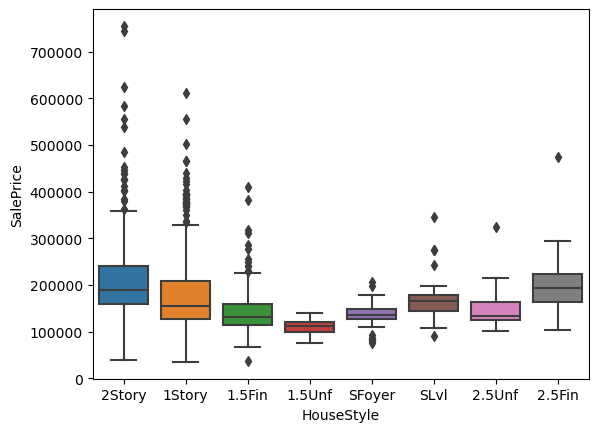

In [144]:
# HouseStyle
print(houses['HouseStyle'].isna().sum())
# 0 NAs
houses['HouseStyle'].value_counts()
# No Cleaning Required
sns.boxplot(x = 'HouseStyle', y = 'SalePrice', data = houses)
houses['HouseStyle'] = houses['HouseStyle'].apply(lambda x: '2Story' if x in ['2Story', '2.5Fin'] else x)
houses['HouseStyle'].value_counts()

In [145]:
# OverallQual
print(houses['OverallQual'].isna().sum())
# 0 NAs
# Convert to categorical
houses['OverallQual'].value_counts()


0


5     825
6     731
7     600
8     342
4     226
9     107
3      40
10     31
2      13
1       4
Name: OverallQual, dtype: int64

In [146]:
# OverallCond
print(houses['OverallCond'].isna().sum())
# 0 NAs
# Convert to categorical since reported discretely
houses['OverallCond'].value_counts()
# # Combine levels of categories 
# houses['OverallCond'] = houses['OverallCond'].apply(lambda x: '2' if x in [1,2] else x) # combines 1 and 2 into a single poor category 2
# houses['OverallCond'] = houses['OverallCond'].apply(lambda x: '4' if x in [3,4] else x)  # Combines 3 and 4 into 4, which represents the below average category
# houses['OverallCond'] = houses['OverallCond'].apply(lambda x: '8' if x in [8,9] else x)
# houses['OverallCond'].value_counts()

0


5    1645
6     531
7     390
8     144
4     101
3      50
9      41
2      10
1       7
Name: OverallCond, dtype: int64

In [147]:
# YearBuilt
print(houses['YearBuilt'].isna().sum())
# 0 NAs - no data cleaning required
houses['YearBuilt'].describe()

# #Step 3: Check skewness
stats.skew(houses['YearBuilt'])
# # skewness is -0.59, tranform it into an age variable
houses['HouseAge'] = 2024 - houses['YearBuilt']
stats.skew(houses['HouseAge'])
# skewness is -0.15

# # Remove YrBuilt
houses = houses.drop('YearBuilt', axis = 'columns')

0


In [148]:
# YearRemodAdd
print(houses['YearRemodAdd'].isna().sum())
# 0 NAs 
# Step 2: Check for outliers and replace with average
houses['YearRemodAdd'].describe()
# # #Step 3: Check skewness
# stats.skew(houses['YearRemodAdd'])
# # skewness is -0.45, tranform it into an age variable

# houses['RemodAge'] = 2024 - houses['YearRemodAdd']

# houses['RemodAge_log'] = np.log(houses['RemodAge'])
# stats.skew(houses['RemodAge_log'])
# # New skewness after transformation is 0.08, still a bit concerning but not as concerning as the predictor as is.
# houses = houses.drop('YearRemodAdd', axis = 'columns')
# houses = houses.drop('RemodAge', axis = 'columns')
# # Due to a possibility of high multicollinearity with HouseAge_log, remove RemodAge_log variable
# houses = houses.drop('RemodAge_log', axis = 'columns') 
# TODO: Add isRemodeled column

0


count    2919.000000
mean     1984.264474
std        20.894344
min      1950.000000
25%      1965.000000
50%      1993.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64

In [149]:
# RoofStyle
print(houses['RoofStyle'].isna().sum())
# 0 NAs
houses['RoofStyle'].value_counts()


0


Gable      2310
Hip         551
Gambrel      22
Flat         20
Mansard      11
Shed          5
Name: RoofStyle, dtype: int64

In [150]:
# RoofMatl
print(houses['RoofMatl'].isna().sum())
# 0 NAs
houses['RoofMatl'].value_counts()
# # Since an overwhelminging majority of the data is one category, I decide to remove this variable from modeling
# houses = houses.drop('RoofMatl', axis = 'columns')

0


CompShg    2876
Tar&Grv      23
WdShake       9
WdShngl       7
Metal         1
Membran       1
Roll          1
ClyTile       1
Name: RoofMatl, dtype: int64

In [151]:
# Exterior1st
print(houses['Exterior1st'].isna().sum())
# 1 NA
houses['Exterior1st'] = houses['Exterior1st'].fillna('Other')
houses['Exterior1st'].value_counts()
# Combine levels of data - due to levels being similar

houses['Exterior1st'] = houses['Exterior1st'].apply(lambda x: 'Stone' if x in ['Stone', 'ImStucc'] else x)
houses['Exterior1st'] = houses['Exterior1st'].apply(lambda x: 'Wd Sdng' if x in ['Stucco', 'Wd Sdng'] else x)
houses['Exterior1st'] = houses['Exterior1st'].apply(lambda x: 'Other' if x in ['BrkComm','Stone', 'AsphShn', 'CBlock', 'Other'] else x)
houses['Exterior1st'].value_counts()

1


VinylSd    1025
Wd Sdng     454
MetalSd     450
HdBoard     442
Plywood     221
CemntBd     126
BrkFace      87
WdShing      56
AsbShng      44
Other        14
Name: Exterior1st, dtype: int64

In [152]:
# Exterior2nd
print(houses['Exterior2nd'].isna().sum())
# 1 NA
houses['Exterior2nd'] = houses['Exterior2nd'].fillna('VinylSd')
houses['Exterior2nd'].value_counts()
houses['Exterior2nd'] = houses['Exterior2nd'].apply(lambda x: 'Stone' if x in ['Stone', 'ImStucc'] else x)
houses['Exterior2nd'] = houses['Exterior2nd'].apply(lambda x: 'Wd Sdng' if x in ['Stucco', 'Wd Sdng'] else x)
houses['Exterior2nd'] = houses['Exterior2nd'].apply(lambda x: 'Other' if x in ['BrkComm','Stone', 'AsphShn', 'CBlock', 'Other'] else x)
houses['Exterior2nd'].value_counts()
# Correct spelling error on Exterior2nd
houses.loc[houses['Exterior2nd'] == 'CmentBd', 'Exterior2nd'] = 'CemntBd'
houses['Exterior2nd'].value_counts()
# # Combine levels of data 
# TODO: Combine Exterior2nd with Exterior1st
all_exteriors = set(houses['Exterior1st'].astype('category').cat.categories).union(set(houses['Exterior2nd'].astype('category').cat.categories))
for exterior in all_exteriors:
    houses['Exterior_' + exterior] = houses.apply(lambda x: 1 if exterior in {x['Exterior1st'], x['Exterior2nd']} else 0, axis = 1)

1


In [153]:
for exterior in all_exteriors:
    print(houses['Exterior_' + exterior].value_counts())

# Drop Condition1 and Condition2
houses = houses.drop('Exterior1st', axis = 'columns')
houses = houses.drop('Exterior2nd', axis = 'columns')

0    2418
1     501
Name: Exterior_Wd Sdng, dtype: int64
0    2881
1      38
Name: Exterior_Other, dtype: int64
0    2897
1      22
Name: Exterior_Brk Cmn, dtype: int64
0    2838
1      81
Name: Exterior_Wd Shng, dtype: int64
0    1884
1    1035
Name: Exterior_VinylSd, dtype: int64
0    2454
1     465
Name: Exterior_HdBoard, dtype: int64
0    2791
1     128
Name: Exterior_CemntBd, dtype: int64
0    2459
1     460
Name: Exterior_MetalSd, dtype: int64
0    2872
1      47
Name: Exterior_AsbShng, dtype: int64
0    2829
1      90
Name: Exterior_BrkFace, dtype: int64
0    2614
1     305
Name: Exterior_Plywood, dtype: int64
0    2863
1      56
Name: Exterior_WdShing, dtype: int64


In [154]:
# MasVnrType
print(houses['MasVnrType'].isna().sum())
# 24 NAs
houses['MasVnrType'] = houses['MasVnrType'].fillna('None')
houses['MasVnrType'].value_counts()
# # Combine variables
# houses['MasVnrType'] = houses['MasVnrType'].apply(lambda x: 'BrkFace' if x in ['BrkFace', 'BrkCmn'] else x)
# houses['MasVnrType'].value_counts()

24


None       1766
BrkFace     879
Stone       249
BrkCmn       25
Name: MasVnrType, dtype: int64

In [155]:
# MasVnrArea
print(houses['MasVnrArea'].isna().sum())
# 23 NAs - fill with mean
houses['MasVnrArea'] = houses['MasVnrArea'].fillna(houses['MasVnrArea'].mean())
houses['MasVnrArea'].describe()
# Step 2: Handle outliers



# # Step 3: Check skewness
stats.skew(houses['MasVnrArea'])
# 2.61 skewness


23


2.6115493751087344

0


<Axes: xlabel='ExterQual', ylabel='SalePrice'>

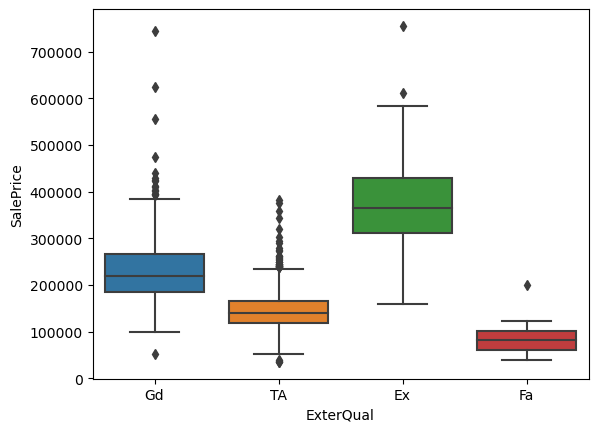

In [156]:
#ExterQual
print(houses['ExterQual'].isna().sum())
# 0 NA
houses['ExterQual'].value_counts()
sns.boxplot(x = 'ExterQual', y = 'SalePrice', data = houses)

0


<Axes: xlabel='ExterCond', ylabel='SalePrice'>

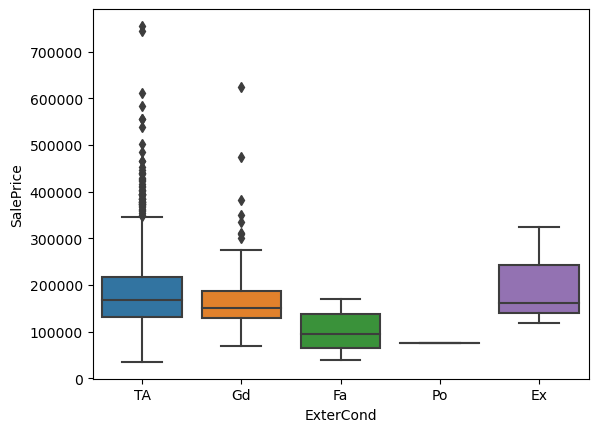

In [157]:
# ExterCond 
print(houses['ExterCond'].isna().sum())
# 0 NA
houses['ExterCond'].value_counts()
# # Since the typical average category takes over more than 85% of the data, it's best to drop this variable from modeling
sns.boxplot(x = 'ExterCond', y = 'SalePrice', data = houses)

In [158]:
# Foundation
print(houses['Foundation'].isna().sum())
# 0 NAs
houses['Foundation'].value_counts()


0


PConc     1308
CBlock    1235
BrkTil     311
Slab        49
Stone       11
Wood         5
Name: Foundation, dtype: int64

In [159]:
# BsmtQual
print(houses['BsmtQual'].isna().sum())
# 81 NAs
houses['BsmtQual'] = houses['BsmtQual'].fillna('Gd')
houses['BsmtQual'].value_counts()
# Combine good and excellent as one category


81


Gd    1290
TA    1283
Ex     258
Fa      88
Name: BsmtQual, dtype: int64

In [160]:
# BsmtCond
print(houses['BsmtCond'].isna().sum())
# 82 NAs
houses['BsmtCond'] = houses['BsmtCond'].fillna('No Basement')
houses['BsmtCond'].value_counts()
# Since the TA category dominates the vast majority of the data for this variable, I am going to delete the variable from modeling


82


TA             2606
Gd              122
Fa              104
No Basement      82
Po                5
Name: BsmtCond, dtype: int64

In [161]:
# BsmtExposure 
print(houses['BsmtExposure'].isna().sum())
# 82 NAs
houses['BsmtExposure'] = houses['BsmtExposure'].fillna('No Basement')
houses['BsmtExposure'].value_counts()
# No further cleaning needed

82


No             1904
Av              418
Gd              276
Mn              239
No Basement      82
Name: BsmtExposure, dtype: int64

In [162]:
# BsmtFinType1
print(houses['BsmtFinType1'].isna().sum())
# 79 NAs
houses['BsmtFinType1'] = houses['BsmtFinType1'].fillna('No Basement')
houses['BsmtFinType1'].value_counts()
# Combine Levels
houses['BsmtFinType1'] = houses['BsmtFinType1'].apply(lambda x: 'Average' if x in ['ALQ', 'Rec'] else x)
houses['BsmtFinType1'] = houses['BsmtFinType1'].apply(lambda x: 'Below Average' if x in ['BLQ', 'LwQ'] else x)

79


In [163]:
# BsmtFinSF1
print(houses['BsmtFinSF1'].isna().sum())
# 1 NA - fill with mean
houses['BsmtFinSF1'] = houses['BsmtFinSF1'].fillna(houses['BsmtFinSF1'].mean())

houses['BsmtFinSF1'].describe()

# # Step 3: Check skewness
# stats.skew(houses['BsmtFinSF1'])
# # skewness is 0.85 - transform variable
# houses['BsmtFinSF1_cbrt'] = np.cbrt(houses['BsmtFinSF1'])
# stats.skew(houses['BsmtFinSF1_cbrt'])
# # Skewness is -0.35
# # Drop original variable to avoid multicollinearity
# houses = houses.drop('BsmtFinSF1', axis = 'columns')

# # Due to high multicollinearity with BsmtUnfSF, remove this variable
# houses = houses.drop('BsmtFinSF1_cbrt', axis = 'columns')
houses = houses.drop('BsmtFinSF1', axis = 'columns')

1


In [164]:
# BsmtFinType2
print(houses['BsmtFinType2'].isna().sum())
# 80 NAs
houses['BsmtFinType2'] = houses['BsmtFinType2'].fillna('No Basement')
houses['BsmtFinType2'].value_counts()
houses['BsmtFinType2'] = houses['BsmtFinType2'].apply(lambda x: 'Average' if x in ['ALQ', 'Rec'] else x)
houses['BsmtFinType2'] = houses['BsmtFinType2'].apply(lambda x: 'Below Average' if x in ['BLQ', 'LwQ'] else x)
# TODO: Combine FinType1 and FinType2
all_basementtypes = set(houses['BsmtFinType1'].astype('category').cat.categories).union(set(houses['BsmtFinType2'].astype('category').cat.categories))
for basement_type in all_basementtypes:
    houses['BsmtFinType_' + basement_type] = houses.apply(lambda x: 1 if basement_type in {x['BsmtFinType1'], x['BsmtFinType2']} else 0, axis = 1)
for basement_type in all_basementtypes:
    print(houses['BsmtFinType_' + basement_type].value_counts())
    
# Drop BsmtFinType1 and BsmtFinType2
houses = houses.drop('BsmtFinType1', axis = 'columns')
houses = houses.drop('BsmtFinType2', axis = 'columns')

80
0    2036
1     883
Name: BsmtFinType_GLQ, dtype: int64
0    2839
1      80
Name: BsmtFinType_No Basement, dtype: int64
1    2493
0     426
Name: BsmtFinType_Unf, dtype: int64
0    2100
1     819
Name: BsmtFinType_Average, dtype: int64
0    2376
1     543
Name: BsmtFinType_Below Average, dtype: int64


In [165]:
# BsmtFinSF2
print(houses['BsmtFinSF2'].isna().sum())
# 1 NA
houses['BsmtFinSF2'] = houses['BsmtFinSF2'].fillna(houses['BsmtFinSF2'].mean())
houses['BsmtFinSF2'].describe()
# # Step 2: Check for outliers
# upper_quartile_BsmtFinSF2 = houses['BsmtFinSF2'].quantile(0.75)
# lower_quartile_BsmtFinSF2 = houses['BsmtFinSF2'].quantile(0.25)
# BsmtFinSF2_IQR = upper_quartile_BsmtFinSF2 - lower_quartile_BsmtFinSF2

# upper_threshold_BsmtFinSF2 = upper_quartile_BsmtFinSF2 + 3 * BsmtFinSF2_IQR
# lower_threshold_BsmtFinSF2 = lower_quartile_BsmtFinSF2 - 3 * BsmtFinSF2_IQR

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses.BsmtFinSF2 > upper_threshold_BsmtFinSF2, "BsmtFinSF2"] = houses['BsmtFinSF2'].mean()
# houses.loc[houses.BsmtFinSF2 < lower_threshold_BsmtFinSF2, "BsmtFinSF2"] = houses['BsmtFinSF2'].mean()

# # Step 3: Check Skewness
# stats.skew(houses['BsmtFinSF2'])
# # 2.35 skewness
# houses['BsmtFinSF2_sqrt'] = np.sqrt(houses['BsmtFinSF2'])
# stats.skew(houses['BsmtFinSF2_sqrt'])

# # Drop variable due to skewness
# houses = houses.drop('BsmtFinSF2', axis = 'columns')

# # Drop BsmtFinSF2 due to multicollinearity
# houses = houses.drop('BsmtFinSF2_sqrt', axis = 'columns')
houses = houses.drop('BsmtFinSF2', axis = 'columns')

1


In [166]:
# BsmtUnfSF
print(houses['BsmtUnfSF'].isna().sum())
# 1 NA
houses['BsmtUnfSF'] = houses['BsmtUnfSF'].fillna(houses['BsmtUnfSF'].mean())

houses['BsmtUnfSF'].describe()

stats.skew(houses['BsmtUnfSF'])
# 0.919

1


0.9195083116601191

In [167]:
# TotalBsmtSF
print(houses['TotalBsmtSF'].isna().sum())
# 1 NA
houses['TotalBsmtSF'] = houses['TotalBsmtSF'].fillna(houses['TotalBsmtSF'].mean())

houses['TotalBsmtSF'].describe()

stats.skew(houses['TotalBsmtSF'])
# 1.16 


1


1.1624837493331972

In [168]:
# Heating
print(houses['Heating'].isna().sum())
# 0 NAs
houses['Heating'].value_counts()
# # Since Gas A category accounts for more than 85% of the data, it's best to drop this variable from the modeling stage
# houses = houses.drop('Heating', axis = 'columns')

0


GasA     2874
GasW       27
Grav        9
Wall        6
OthW        2
Floor       1
Name: Heating, dtype: int64

In [169]:
# Heating QC
print(houses['HeatingQC'].isna().sum())
# 0 NA
houses['HeatingQC'].value_counts()


0


Ex    1493
TA     857
Gd     474
Fa      92
Po       3
Name: HeatingQC, dtype: int64

In [170]:
# CentralAir
print(houses['CentralAir'].isna().sum())
# 0 NA
houses['CentralAir'].value_counts()
# # Since the vast majority of houses in the data have yes to air condition, we are deleting the variable entirely
# houses = houses.drop('CentralAir', axis = 'columns')

0


Y    2723
N     196
Name: CentralAir, dtype: int64

In [171]:
# Electrical
print(houses['Electrical'].isna().sum())
# 1 NA
houses['Electrical'] = houses['Electrical'].fillna('SBrkr')
houses['Electrical'].value_counts()
# # Since over 85% of the data is assigned to SBrkr category, I am deleting this variable entirely
# houses = houses.drop('Electrical', axis = 'columns')

1


SBrkr    2672
FuseA     188
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

In [172]:
# 1stFlrSF
print(houses['1stFlrSF'].isna().sum())
# 0 NA
houses['1stFlrSF'].describe()

stats.skew(houses['1stFlrSF'])
# 1.46


0


1.4696044169256821

In [173]:
# 2ndFlrSF
print(houses['2ndFlrSF'].isna().sum())
# 0 NA
houses['2ndFlrSF'].describe()

# Check skewness
stats.skew(houses['2ndFlrSF'])
# 0.86


0


0.8616747488436027

In [174]:
# LowQualFinSF
print(houses['LowQualFinSF'].isna().sum())
# 0 NA
houses['LowQualFinSF'].describe()

stats.skew(houses['LowQualFinSF'])
# 12.088
houses['LowQualFinSF_cbrt'] = np.cbrt(houses['LowQualFinSF'])
stats.skew(houses['LowQualFinSF_cbrt'])

# Drop the variable due to skewness
houses = houses.drop('LowQualFinSF', axis = 'columns')
houses = houses.drop('LowQualFinSF_cbrt', axis = 'columns')


0


In [175]:
# GrLivArea
print(houses['GrLivArea'].isna().sum())
# 0 NA
houses['GrLivArea'].describe()

stats.skew(houses['GrLivArea'])
# 1.269


0


1.269357688230336

In [176]:
# BsmtFullBath
# Step 1: Handle Missing Values

print(houses['BsmtFullBath'].isna().sum())
# 2 NA
houses['BsmtFullBath'] = houses['BsmtFullBath'].fillna('0.0')
houses['BsmtFullBath'] = houses['BsmtFullBath'].astype('float64').astype('int64')
houses['BsmtFullBath'].value_counts()


2


0    1707
1    1172
2      38
3       2
Name: BsmtFullBath, dtype: int64

In [177]:
# BsmtHalfBath

print(houses['BsmtHalfBath'].isna().sum())
# 2 NA
houses['BsmtHalfBath'] = houses['BsmtHalfBath'].fillna('0')
houses['BsmtHalfBath'].value_counts()

houses['BsmtHalfBath'] = houses['BsmtHalfBath'].astype('float64').astype('int64')

# Since 0 Bsmt Half Baths take up more than 85% of the data for this column, we are deleting this variable for modeling
stats.skew(houses['BsmtHalfBath'])
# 3.93 


2


3.9315938391525584

In [178]:
# FullBath
print(houses['FullBath'].isna().sum())
# 0 NAs
houses['FullBath'].value_counts()



0


2    1530
1    1309
3      64
0      12
4       4
Name: FullBath, dtype: int64

In [179]:
# HalfBath
print(houses['HalfBath'].isna().sum())
# 0 NAs
houses['HalfBath'] = houses['HalfBath'].astype('int64')
houses['HalfBath'].value_counts()


0


0    1834
1    1060
2      25
Name: HalfBath, dtype: int64

In [180]:
# Bedroom
print(houses['BedroomAbvGr'].isna().sum())
# 0 NA
houses['BedroomAbvGr'].value_counts()

0


3    1596
2     742
4     400
1     103
5      48
6      21
0       8
8       1
Name: BedroomAbvGr, dtype: int64

In [181]:
# Kitchen
print(houses['KitchenAbvGr'].isna().sum())
# 0 NA
# Convert to categorical 
houses['KitchenAbvGr'] = houses['KitchenAbvGr'].astype('int64')
houses['KitchenAbvGr'].value_counts()


0


1    2785
2     129
0       3
3       2
Name: KitchenAbvGr, dtype: int64

In [182]:
# KitchenQual
print(houses['KitchenQual'].isna().sum())
# 1 NA
houses['KitchenQual'] = houses['KitchenQual'].fillna('TA')
houses['KitchenQual'].value_counts()


1


TA    1493
Gd    1151
Ex     205
Fa      70
Name: KitchenQual, dtype: int64

In [183]:
# TotRmsAbvGrd
print(houses['TotRmsAbvGrd'].isna().sum())
# 0 NA
houses['TotRmsAbvGrd'] = houses['TotRmsAbvGrd'].astype('int64')
houses['TotRmsAbvGrd'].value_counts()
stats.skew(houses['TotRmsAbvGrd'])
# 0.7583

0


0.7583669060998621

In [184]:
# Functional 
print(houses['Functional'].isna().sum())
# 2 NAs
houses['Functional'] = houses['Functional'].fillna('Typ')

houses['Functional'].value_counts()


2


Typ     2719
Min2      70
Min1      65
Mod       35
Maj1      19
Maj2       9
Sev        2
Name: Functional, dtype: int64

In [185]:
# Fireplaces
print(houses['Fireplaces'].isna().sum())
# 0 NAs
# Since Fireplaces is reported discretely, we need to convert to int64
houses['Fireplaces'] = houses['Fireplaces'].astype('int64')
houses['Fireplaces'].value_counts()



0


0    1420
1    1268
2     219
3      11
4       1
Name: Fireplaces, dtype: int64

In [186]:
# FireplaceQu
print(houses['FireplaceQu'].isna().sum())
# 1420 NAs
houses['FireplaceQu'] = houses['FireplaceQu'].fillna('No Fireplace')
houses['FireplaceQu'].value_counts()


1420


No Fireplace    1420
Gd               744
TA               592
Fa                74
Po                46
Ex                43
Name: FireplaceQu, dtype: int64

In [187]:
# GarageType
print(houses['GarageType'].isna().sum())
# 157 NA
houses['GarageType'] = houses['GarageType'].fillna('No Garage')
houses['GarageType'].value_counts()

157


Attchd       1723
Detchd        779
BuiltIn       186
No Garage     157
Basment        36
2Types         23
CarPort        15
Name: GarageType, dtype: int64

In [188]:
# GarageYrBuilt
# Step 1: Handle Missing Values
print(houses['GarageYrBlt'].isna().sum())
# 159 NAs
houses['GarageYrBlt'] = houses['GarageYrBlt'].fillna('9999')
houses['GarageYrBlt'] = houses['GarageYrBlt'].astype('int64')
houses['GarageYrBlt'].describe()
houses.loc[houses['GarageYrBlt'] > 2024, 'GarageYrBlt'] = 9999

159


In [189]:
# GarageFinish
print(houses['GarageFinish'].isna().sum())
# 159 NA
houses['GarageFinish'] = houses['GarageFinish'].fillna('No Garage')
houses['GarageFinish'].value_counts()
#

159


Unf          1230
RFn           811
Fin           719
No Garage     159
Name: GarageFinish, dtype: int64

In [190]:
# GarageCars
print(houses['GarageCars'].isna().sum())
# 2 NA
houses['GarageCars'] = houses['GarageCars'].fillna('0')
houses['GarageCars'].value_counts()

houses['GarageCars'] = houses['GarageCars'].astype('float64').astype('int64')


1


In [191]:
# GarageArea
# Step 1: Handle Missing Values
print(houses['GarageArea'].isna().sum())
# 1 NAs
houses['GarageArea'] = houses['GarageArea'].fillna(houses['GarageArea'].mean())

# # Step 2: Deal with outliers
# upper_quartile_GarageArea = houses['GarageArea'].quantile(0.75)
# lower_quartile_GarageArea = houses['GarageArea'].quantile(0.25)
# IQR_GarageArea = upper_quartile_GarageArea - lower_quartile_GarageArea

# upper_threshold_GarageArea = upper_quartile_GarageArea + 3 * IQR_GarageArea
# lower_threshold_GarageArea = lower_quartile_GarageArea - 3 * IQR_GarageArea

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['GarageArea'] > upper_threshold_GarageArea, "GarageArea"] = houses['GarageArea'].mean()
# houses.loc[houses['GarageArea'] < lower_threshold_GarageArea, "GarageArea"] = houses['GarageArea'].mean()

# # Step 3: Check skewness
stats.skew(houses['GarageArea'])
# 0.24


1


0.241217781017102

In [192]:
# GarageQual
print(houses['GarageQual'].isna().sum())
# 159 NA
houses['GarageQual'] = houses['GarageQual'].fillna('No Garage')
houses['GarageQual'].value_counts()


159


TA           2604
No Garage     159
Fa            124
Gd             24
Po              5
Ex              3
Name: GarageQual, dtype: int64

In [193]:
# GarageCond
print(houses['GarageCond'].isna().sum())
# 159 NA
houses['GarageCond'] = houses['GarageCond'].fillna('No Garage')
houses['GarageCond'].value_counts()

159


TA           2654
No Garage     159
Fa             74
Gd             15
Po             14
Ex              3
Name: GarageCond, dtype: int64

In [194]:
# PavedDrive
print(houses['PavedDrive'].isna().sum())
# 0 NA
houses['PavedDrive'].value_counts()
# # Since the Paved category accounts for the vast majority of the data, I am dropping this variable (due to it's irrelevancy)
# houses = houses.drop('PavedDrive', axis = 'columns')

0


Y    2641
N     216
P      62
Name: PavedDrive, dtype: int64

In [195]:
# WoodDeckSF
print(houses['WoodDeckSF'].isna().sum())
# 0 NA
# # Step 2: Deal with outliers
# upper_quartile_WoodDeckSF= houses['WoodDeckSF'].quantile(0.75)
# lower_quartile_WoodDeckSF = houses['WoodDeckSF'].quantile(0.25)
# IQR_WoodDeckSF = upper_quartile_WoodDeckSF - lower_quartile_WoodDeckSF

# upper_threshold_WoodDeckSF = upper_quartile_WoodDeckSF + 3 * IQR_WoodDeckSF
# lower_threshold_WoodDeckSF = lower_quartile_WoodDeckSF - 3 * IQR_WoodDeckSF

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['WoodDeckSF'] > upper_threshold_WoodDeckSF, "WoodDeckSF"] = houses['WoodDeckSF'].mean()
# houses.loc[houses['WoodDeckSF'] < lower_threshold_WoodDeckSF, "WoodDeckSF"] = houses['WoodDeckSF'].mean()

stats.skew(houses['WoodDeckSF'])
# # 1.84
houses['WoodDeckSF_cbrt'] = np.cbrt(houses['WoodDeckSF'])
stats.skew(houses['WoodDeckSF_cbrt'])
# # 0.28
# # Drop original variable to avoid multicollinearity
houses = houses.drop('WoodDeckSF', axis = 'columns')

# # Remove WoodDeckSF_cbrt from model due to multicollinearity
# houses = houses.drop('WoodDeckSF_cbrt', axis = 'columns')

0


In [196]:
# OpenPorchSF
print(houses['OpenPorchSF'].isna().sum())
# 0 NA
# # Step 2: Deal with outliers
# upper_quartile_OpenPorchSF= houses['OpenPorchSF'].quantile(0.75)
# lower_quartile_OpenPorchSF = houses['OpenPorchSF'].quantile(0.25)
# IQR_OpenPorchSF = upper_quartile_OpenPorchSF - lower_quartile_OpenPorchSF

# upper_threshold_OpenPorchSF = upper_quartile_OpenPorchSF + 3 * IQR_OpenPorchSF
# lower_threshold_OpenPorchSF = lower_quartile_OpenPorchSF - 3 * IQR_OpenPorchSF

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['OpenPorchSF'] > upper_threshold_OpenPorchSF, "OpenPorchSF"] = houses['OpenPorchSF'].mean()
# houses.loc[houses['OpenPorchSF'] < lower_threshold_OpenPorchSF, "OpenPorchSF"] = houses['OpenPorchSF'].mean()

stats.skew(houses['OpenPorchSF'])
# 1.58
houses['OpenPorchSF_cbrt'] = np.cbrt(houses['OpenPorchSF'])
stats.skew(houses['OpenPorchSF_cbrt'])
# 0.1027
# Drop original OpenPorchSF to avoid multicollinearity
houses = houses.drop('OpenPorchSF', axis = 'columns')
# Drop OpenPorch_cbrt due to multicollinearity with HouseAge
houses = houses.drop('OpenPorchSF_cbrt', axis = 'columns')

0


In [197]:
# EnclosedPorch
print(houses['EnclosedPorch'].isna().sum())
# 0 NA
# # Step 2: Deal with outliers
# upper_quartile_EnclosedPorch = houses['EnclosedPorch'].quantile(0.75)
# lower_quartile_EnclosedPorch = houses['EnclosedPorch'].quantile(0.25)
# IQR_EnclosedPorch = upper_quartile_EnclosedPorch - lower_quartile_EnclosedPorch

# upper_threshold_EnclosedPorch = upper_quartile_EnclosedPorch + 3 * IQR_EnclosedPorch
# lower_threshold_EnclosedPorch = lower_quartile_EnclosedPorch - 3 * IQR_EnclosedPorch

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['EnclosedPorch'] > upper_threshold_EnclosedPorch, "EnclosedPorch"] = houses['EnclosedPorch'].mean()
# houses.loc[houses['EnclosedPorch'] < lower_threshold_EnclosedPorch, "EnclosedPorch"] = houses['EnclosedPorch'].mean()

# stats.skew(houses['EnclosedPorch'])
# # 1.88 - leave as original since transformations leave skewness the same

houses = houses.drop('EnclosedPorch', axis = 'columns')

0


In [198]:
# 3Snporch
print(houses['3SsnPorch'].isna().sum())
# 0 NA
# upper_quartile_3snPorch = houses['3SsnPorch'].quantile(0.75)
# lower_quartile_3SsnPorch = houses['3SsnPorch'].quantile(0.25)
# IQR_3SsnPorch = upper_quartile_3snPorch - lower_quartile_3SsnPorch

# upper_threshold_3SsnPorch = upper_quartile_3snPorch + 3 * IQR_3SsnPorch
# lower_threshold_3SsnPorch = lower_quartile_3SsnPorch - 3 * IQR_3SsnPorch

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['3SsnPorch'] > upper_threshold_3SsnPorch, "3SsnPorch"] = houses['3SsnPorch'].mean()
# houses.loc[houses['3SsnPorch'] < lower_threshold_3SsnPorch, "3SsnPorch"] = houses['3SsnPorch'].mean()

stats.skew(houses['3SsnPorch'])
# 11.37
houses['3SsnPorch_cbrt'] = np.cbrt(houses['3SsnPorch'])
stats.skew(houses['3SsnPorch_cbrt'])
# 9.01

# # Drop variable since tranformations don't improve skewness
houses = houses.drop('3SsnPorch', axis = 'columns' )

0


In [199]:
# ScreenPorch
print(houses['ScreenPorch'].isna().sum())
# 0 NA
# upper_quartile_ScreenPorch = houses['ScreenPorch'].quantile(0.75)
# lower_quartile_ScreenPorch = houses['ScreenPorch'].quantile(0.25)
# IQR_ScreenPorch = upper_quartile_ScreenPorch - lower_quartile_ScreenPorch

# upper_threshold_ScreenPorch = upper_quartile_ScreenPorch + 3 * IQR_ScreenPorch
# lower_threshold_ScreenPorch = lower_quartile_ScreenPorch - 3 * IQR_ScreenPorch

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['ScreenPorch'] > upper_threshold_ScreenPorch, "ScreenPorch"] = houses['ScreenPorch'].mean()
# houses.loc[houses['ScreenPorch'] < lower_threshold_ScreenPorch, "ScreenPorch"] = houses['ScreenPorch'].mean()


0


In [200]:
# PoolArea
print(houses['PoolArea'].isna().sum())
# 0 NA
# upper_quartile_PoolArea = houses['PoolArea'].quantile(0.75)
# lower_quartile_PoolArea = houses['PoolArea'].quantile(0.25)
# IQR_PoolArea = upper_quartile_PoolArea - lower_quartile_PoolArea

# upper_threshold_PoolArea = upper_quartile_PoolArea + 3 * IQR_PoolArea
# lower_threshold_PoolArea = lower_quartile_PoolArea - 3 * IQR_PoolArea

# # # Replace data points above the upper threshold or below the lower threshold with the mean
# houses.loc[houses['PoolArea'] > upper_threshold_PoolArea, "PoolArea"] = houses['PoolArea'].mean()
# houses.loc[houses['PoolArea'] < lower_threshold_PoolArea, "PoolArea"] = houses['PoolArea'].mean()

stats.skew(houses['PoolArea'])
# 16.898
houses['PoolArea_sqrt'] = np.sqrt(houses['PoolArea'])
stats.skew(houses['PoolArea_sqrt'])
# 15.605
houses = houses.drop('PoolArea', axis = 'columns')
houses = houses.drop('PoolArea_sqrt', axis = 'columns')

0


In [201]:
# PoolQC
print(houses['PoolQC'].isna().sum())
# 2909 NA
houses['PoolQC'] = houses['PoolQC'].fillna('No Pool')
houses['PoolQC'].value_counts()


2909


No Pool    2909
Ex            4
Gd            4
Fa            2
Name: PoolQC, dtype: int64

In [202]:
# Fence
print(houses['Fence'].isna().sum())
# 2348 NA
houses['Fence'] = houses['Fence'].fillna('No Fence')
houses['Fence'].value_counts()


2348


No Fence    2348
MnPrv        329
GdPrv        118
GdWo         112
MnWw          12
Name: Fence, dtype: int64

In [203]:
# MiscFeature
print(houses['MiscFeature'].isna().sum())
# 2814 NAs
houses['MiscFeature'] = houses['MiscFeature'].fillna('None')
houses['MiscFeature'].value_counts()

2814


None    2814
Shed      95
Gar2       5
Othr       4
TenC       1
Name: MiscFeature, dtype: int64

In [204]:
# MiscVal
print(houses['MiscVal'].isna().sum())
# 0 NA
upper_quartile_MiscVal = houses['MiscVal'].quantile(0.75)
lower_quartile_MiscVal = houses['MiscVal'].quantile(0.25)
IQR_MiscVal = upper_quartile_MiscVal - lower_quartile_MiscVal

upper_threshold_MiscVal = upper_quartile_MiscVal + 3 * IQR_MiscVal
lower_threshold_MiscVal = lower_quartile_MiscVal - 3 * IQR_MiscVal

# # Replace data points above the upper threshold or below the lower threshold with the mean
houses.loc[houses['MiscVal'] > upper_threshold_MiscVal, "MiscVal"] = houses['MiscVal'].mean()
houses.loc[houses['MiscVal'] < lower_threshold_MiscVal, "MiscVal"] = houses['MiscVal'].mean()

stats.skew(houses['MiscVal'])
# 5.03

0


5.0374976456359954

In [205]:
# MoSold
print(houses['MoSold'].isna().sum())
# 0 NA
houses['MoSold'].value_counts()
# Combine 12,1,2 together as one Winter Category
houses['MoSold'] = houses['MoSold'].apply(lambda x: 2 if x in [12,1,2] else x)
# Combine 9,10,and 11 together as one Autumn category
houses['MoSold'] = houses['MoSold'].apply(lambda x: 10 if x in [9, 10, 11] else x)
houses['MoSold'].value_counts()

0


6     503
10    473
7     446
5     394
2     359
4     279
8     233
3     232
Name: MoSold, dtype: int64

In [206]:
# YrSold
print(houses['YrSold'].isna().sum())
# 0 NA
houses['YrSold'].value_counts()
# No further data cleaning required 

0


2007    692
2009    647
2008    622
2006    619
2010    339
Name: YrSold, dtype: int64

In [207]:
# SaleType
print(houses['SaleType'].isna().sum())
# 1 NA
houses['SaleType'] = houses['SaleType'].fillna('WD')
houses['SaleType'].value_counts()
# Since WD accounts for more than 85% of the data, drop this variable
houses = houses.drop('SaleType', axis = 'columns')

1


In [208]:
# SaleCondition
print(houses['SaleCondition'].isna().sum())
# 0 NA
houses['SaleCondition'].value_counts()
# Combine Allocation and AdjLand
houses['SaleCondition'] = houses['SaleCondition'].apply(lambda x: 'Alloca' if x in ['Alloca', 'AdjLand'] else x)
houses['SaleCondition'].value_counts()

# Test to see if predictor is important
houses_with_saleCondition_and_salePrice = houses[['SaleCondition', 'SalePrice']]
houses_with_saleCondition_and_salePrice.head()
# plt.figure(figsize=(30,40))
# corr_matrix = houses_with_saleCondition_and_salePrice.corr().abs()
# sns.heatmap(corr_matrix, vmin = .1, annot = True, cmap="Reds")
# plt.show()

0


,SaleCondition,SalePrice
Id,,
1,Normal,208500.0
2,Normal,181500.0
3,Normal,223500.0
4,Abnorml,140000.0
5,Normal,250000.0


In [209]:
# SalePrice - dependent variable
print(houses_train['SalePrice'].isna().sum())
# 0 NA

0


Plain Vanilla Model

In [210]:
houses.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 1 to 2919
Data columns (total 89 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   MSSubClass                 2919 non-null   object 
 1   MSZoning                   2919 non-null   object 
 2   LotFrontage                2919 non-null   float64
 3   LotArea                    2919 non-null   int64  
 4   Alley                      2919 non-null   object 
 5   LotShape                   2919 non-null   object 
 6   LandContour                2919 non-null   object 
 7   Utilities                  2919 non-null   object 
 8   LotConfig                  2919 non-null   object 
 9   LandSlope                  2919 non-null   object 
 10  Neighborhood               2919 non-null   object 
 11  BldgType                   2919 non-null   object 
 12  HouseStyle                 2919 non-null   object 
 13  OverallQual                2919 non-null   int64

In [223]:
#Reduce to low amount of predictors to the top 25 predictors - that will be predictors that affect SalePrice the most
houses_24_variables = houses.drop(['MSSubClass', 'MiscFeature', 'MiscVal', 'SaleCondition', 'MasVnrType', 'YrSold', 'MoSold', 'MSZoning', 'BldgType', 'YearRemodAdd', 'PoolQC', 'Utilities', 'GarageType', 'Fireplaces', 'KitchenAbvGr', 'KitchenQual', 'LandContour', 'Alley', 'CentralAir', 'Electrical', 'RoofMatl', 'Neighborhood', 'MiscVal', 'MiscFeature', 'BsmtExposure', 'PavedDrive', 'GarageFinish', 'FireplaceQu', 'GarageCond', 'GarageQual', 'BsmtQual', 'BsmtCond', 'LandSlope', 'GarageCars', 'Heating', 'HeatingQC', 'LotShape', 'LotConfig', 'Foundation', 'Functional', 'Fence', 'BsmtUnfSF', 'ExterCond','RoofStyle', 'ExterQual'], axis = 'columns')

In [224]:
# Split testing and training set
houses_24_variables.info()
houses_with_dummies = pd.get_dummies(houses_24_variables)
houses_with_dummies.head()
pd.set_option('display.max_rows', None)
predictors = houses_with_dummies.drop(columns = 'SalePrice')
# predictors.info(True, show_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 1 to 2919
Data columns (total 46 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   LotFrontage                2919 non-null   float64
 1   LotArea                    2919 non-null   int64  
 2   HouseStyle                 2919 non-null   object 
 3   OverallQual                2919 non-null   int64  
 4   OverallCond                2919 non-null   int64  
 5   MasVnrArea                 2919 non-null   float64
 6   TotalBsmtSF                2919 non-null   float64
 7   1stFlrSF                   2919 non-null   int64  
 8   2ndFlrSF                   2919 non-null   int64  
 9   GrLivArea                  2919 non-null   int64  
 10  BsmtFullBath               2919 non-null   int64  
 11  BsmtHalfBath               2919 non-null   int64  
 12  FullBath                   2919 non-null   int64  
 13  HalfBath                   2919 non-null   int64

In [225]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
pd.set_option('display.max_rows', None)
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(predictors.values, i) for i in range(predictors.shape[1])]
vif['variable'] = predictors.columns


In [226]:
vif.sort_values('VIF', ascending = False)

,VIF,variable
46,152.023889,HouseStyle_1Story
8,131.265278,GrLivArea
48,97.594941,HouseStyle_2Story
7,93.921920,2ndFlrSF
6,84.176357,1stFlrSF
44,34.259619,HouseStyle_1.5Fin
50,13.989854,HouseStyle_SLvl
49,9.326214,HouseStyle_SFoyer
29,7.080457,Exterior_VinylSd
5,6.071474,TotalBsmtSF


/var/folders/0m/l4prbb_56q1gl8j3h3qzryb40000gn/T/ipykernel_97465/2314985697.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = houses_train_cleaned.corr().abs()


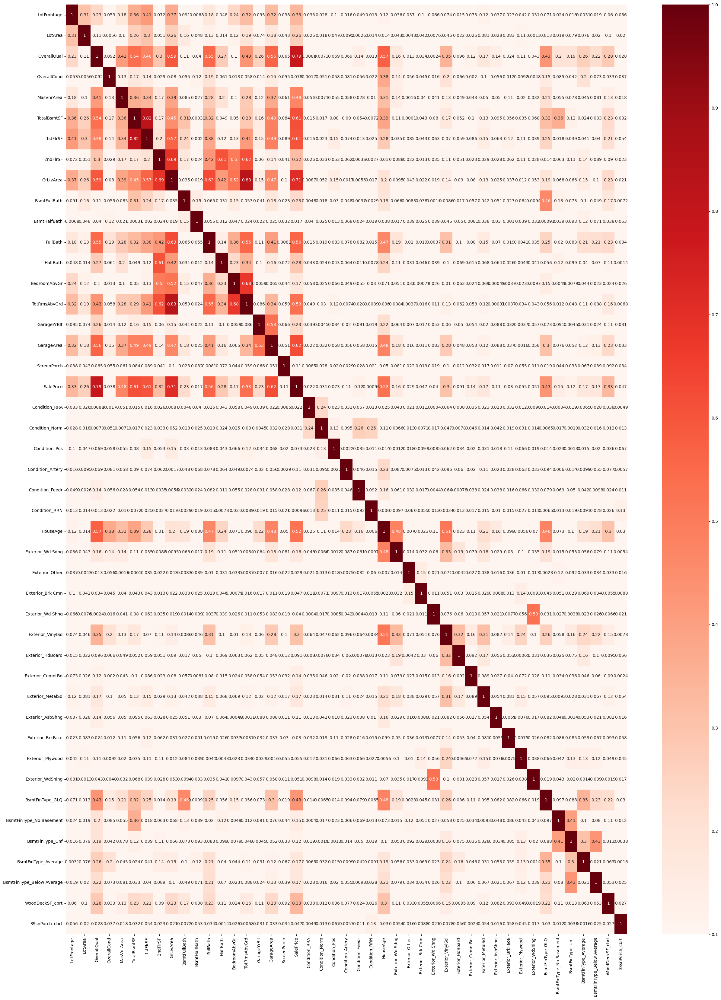

In [227]:
# houses_train_cleaned, houses_test_cleaned = train_test_split(houses, train_size = len(houses_train), test_size = len(houses_test))
houses_train_cleaned, houses_test_cleaned = pd.DataFrame(houses_24_variables[:len(houses_train)]), pd.DataFrame(houses_24_variables[len(houses_train):])
# Plain Vanilla model
# Get Dummies first - try Stepwise Linear Regression 
plt.figure(figsize=(30,40))
corr_matrix = houses_train_cleaned.corr().abs()
sns.heatmap(corr_matrix, vmin = .1, annot = True, cmap="Reds")
plt.show()

In [228]:
houses_test_cleaned.head()


,LotFrontage,LotArea,HouseStyle,OverallQual,OverallCond,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,ScreenPorch,SalePrice,Condition_RRA,Condition_Norm,Condition_Pos,Condition_Artery,Condition_Feedr,Condition_RRN,HouseAge,Exterior_Wd Sdng,Exterior_Other,Exterior_Brk Cmn,Exterior_Wd Shng,Exterior_VinylSd,Exterior_HdBoard,Exterior_CemntBd,Exterior_MetalSd,Exterior_AsbShng,Exterior_BrkFace,Exterior_Plywood,Exterior_WdShing,BsmtFinType_GLQ,BsmtFinType_No Basement,BsmtFinType_Unf,BsmtFinType_Average,BsmtFinType_Below Average,WoodDeckSF_cbrt,3SsnPorch_cbrt
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,80.0,11622,1Story,5,6,0.0,882.0,896,0,896,0,0,1,0,2,5,1961,730.0,120,NaN,0,1,0,0,1,0,63,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,5.192494,0.0
1462,81.0,14267,1Story,6,6,108.0,1329.0,1329,0,1329,0,0,1,1,3,6,1958,312.0,0,NaN,0,1,0,0,0,0,66,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,7.324829,0.0
1463,74.0,13830,2Story,5,5,0.0,928.0,928,701,1629,0,0,2,1,3,6,1997,482.0,0,NaN,0,1,0,0,0,0,27,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,5.962732,0.0
1464,78.0,9978,2Story,6,6,20.0,926.0,926,678,1604,0,0,2,1,3,7,1998,470.0,0,NaN,0,1,0,0,0,0,26,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,7.113787,0.0
1465,43.0,5005,1Story,8,5,0.0,1280.0,1280,0,1280,0,0,2,0,2,5,1992,506.0,144,NaN,0,1,0,0,0,0,32,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0.000000,0.0


In [229]:
houses_train_cleaned_with_dummies = pd.get_dummies(houses_train_cleaned)
houses_train_cleaned_with_dummies.head()


,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageArea,ScreenPorch,SalePrice,Condition_RRA,Condition_Norm,Condition_Pos,Condition_Artery,Condition_Feedr,Condition_RRN,HouseAge,Exterior_Wd Sdng,Exterior_Other,Exterior_Brk Cmn,Exterior_Wd Shng,Exterior_VinylSd,Exterior_HdBoard,Exterior_CemntBd,Exterior_MetalSd,Exterior_AsbShng,Exterior_BrkFace,Exterior_Plywood,Exterior_WdShing,BsmtFinType_GLQ,BsmtFinType_No Basement,BsmtFinType_Unf,BsmtFinType_Average,BsmtFinType_Below Average,WoodDeckSF_cbrt,3SsnPorch_cbrt,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450,7,5,196.0,856.0,856,854,1710,1,0,2,1,3,8,2003,548.0,0,208500.0,0,1,0,0,0,0,21,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0.000000,0.0,0,0,0,0,1,0,0
2,80.0,9600,6,8,0.0,1262.0,1262,0,1262,0,1,2,0,3,6,1976,460.0,0,181500.0,0,1,0,0,1,0,48,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,6.679420,0.0,0,0,1,0,0,0,0
3,68.0,11250,7,5,162.0,920.0,920,866,1786,1,0,2,1,3,6,2001,608.0,0,223500.0,0,1,0,0,0,0,23,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0.000000,0.0,0,0,0,0,1,0,0
4,60.0,9550,7,5,0.0,756.0,961,756,1717,1,0,1,0,3,7,1998,642.0,0,140000.0,0,1,0,0,0,0,109,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0.000000,0.0,0,0,0,0,1,0,0
5,84.0,14260,8,5,350.0,1145.0,1145,1053,2198,1,0,2,1,4,9,2000,836.0,0,250000.0,0,1,0,0,0,0,24,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,5.768998,0.0,0,0,0,0,1,0,0


In [230]:
x_train = sm.add_constant(houses_train_cleaned_with_dummies.drop(columns='SalePrice'))
y_train = houses_train_cleaned_with_dummies['SalePrice']
x_train.info()
# # houses_train_cleaned.info()
# # houses_train_cleaned.head()
# # print(np.asarray(x_train).dtype)
# # # y_train.head()
# print(y_train.dtype)
# x_train.info()
# y_train.info()
model_plain_vanilla = sm.OLS(y_train, x_train).fit()
print(model_plain_vanilla.summary())

# # 1.2 Report the training MSE
RMSE_Train_Plain = np.sqrt(mean_squared_error(y_train, model_plain_vanilla.predict(x_train)))
print(model_plain_vanilla.predict(x_train).round(2))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 52 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   const                      1460 non-null   float64
 1   LotFrontage                1460 non-null   float64
 2   LotArea                    1460 non-null   int64  
 3   OverallQual                1460 non-null   int64  
 4   OverallCond                1460 non-null   int64  
 5   MasVnrArea                 1460 non-null   float64
 6   TotalBsmtSF                1460 non-null   float64
 7   1stFlrSF                   1460 non-null   int64  
 8   2ndFlrSF                   1460 non-null   int64  
 9   GrLivArea                  1460 non-null   int64  
 10  BsmtFullBath               1460 non-null   int64  
 11  BsmtHalfBath               1460 non-null   int64  
 12  FullBath                   1460 non-null   int64  
 13  HalfBath                   1460 non-null   int64

In [231]:
print(y_train)

Id
1       208500.0
2       181500.0
3       223500.0
4       140000.0
5       250000.0
6       143000.0
7       307000.0
8       200000.0
9       129900.0
10      118000.0
11      129500.0
12      345000.0
13      144000.0
14      279500.0
15      157000.0
16      132000.0
17      149000.0
18       90000.0
19      159000.0
20      139000.0
21      325300.0
22      139400.0
23      230000.0
24      129900.0
25      154000.0
26      256300.0
27      134800.0
28      306000.0
29      207500.0
30       68500.0
31       40000.0
32      149350.0
33      179900.0
34      165500.0
35      277500.0
36      309000.0
37      145000.0
38      153000.0
39      109000.0
40       82000.0
41      160000.0
42      170000.0
43      144000.0
44      130250.0
45      141000.0
46      319900.0
47      239686.0
48      249700.0
49      113000.0
50      127000.0
51      177000.0
52      114500.0
53      110000.0
54      385000.0
55      130000.0
56      180500.0
57      172500.0
58      196500.0
59      438

In [232]:
print(mean_squared_error(y_train, model_plain_vanilla.predict(x_train)))
print("Training RMSE (Plain Vanilla Model):", RMSE_Train_Plain)

# # # 1.3 Report the test RMSE
houses_test_cleaned_with_dummies = pd.get_dummies(houses_test_cleaned)
x_test = sm.add_constant(houses_test_cleaned_with_dummies.drop(columns='SalePrice'))

y_test = houses_test_cleaned_with_dummies['SalePrice']
y_test.info()
y_test.head()
y_test = model_plain_vanilla.predict(x_test)

print(y_test.head())
y_test_df = y_test.to_frame(name='SalePrice').reset_index()
y_test_df.head()



1146479309.618652
Training RMSE (Plain Vanilla Model): 33859.700376976936
<class 'pandas.core.series.Series'>
Int64Index: 1459 entries, 1461 to 2919
Series name: SalePrice
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 22.8 KB
Id
1461    132602.265692
1462    171355.389755
1463    164255.162355
1464    193001.425862
1465    203030.734985
dtype: float64


,Id,SalePrice
0,1461,132602.265692
1,1462,171355.389755
2,1463,164255.162355
3,1464,193001.425862
4,1465,203030.734985


In [233]:
y_test_df_csv = y_test_df.to_csv(path_or_buf = 'SalePricePredictions.csv', columns = ['Id', 'SalePrice'], index = False)

In [234]:
# Diagnostic test #2: Are the error terms of normal distribution? 
# houses_train_cleaned['error'] = houses_train_cleaned['calculated_SalePrice'] - houses_train_cleaned['SalePrice']
houses_train_cleaned_with_dummies['error'] = model_plain_vanilla.predict(x_train) - y_train
houses_train_cleaned_with_dummies['error'].describe()

count    1.460000e+03
mean     6.280798e-08
std      3.387130e+04
min     -2.595690e+05
25%     -1.316863e+04
50%      9.889931e+02
75%      1.626418e+04
max      4.770301e+05
Name: error, dtype: float64

<Axes: xlabel='error', ylabel='Density'>

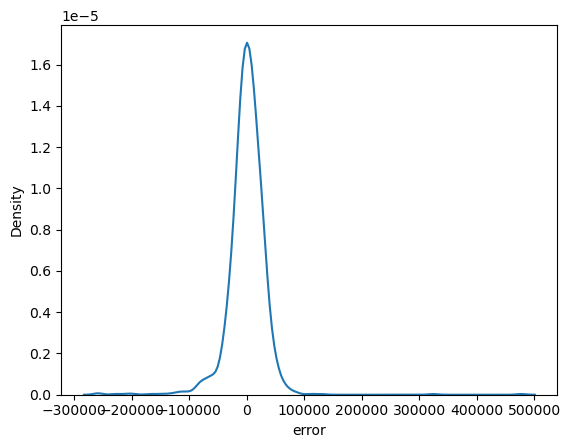

In [235]:
sns.kdeplot(x = "error", data = houses_train_cleaned_with_dummies)

<Axes: ylabel='error'>

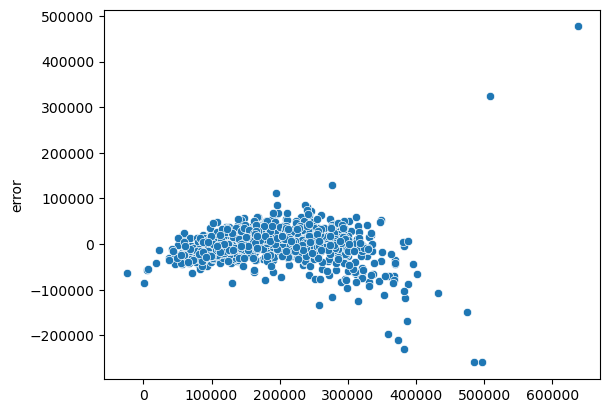

In [236]:
# Diagnostic test #3: Is heteroskedasticity present? 
sns.scatterplot(data = houses_train_cleaned_with_dummies, x = model_plain_vanilla.predict(x_train), y = 'error')

In [237]:
# Further cleaning based on diagnostic tests (if neccessary): variable tranformations, variable removal, etc.
houses_train_cleaned_with_dummies['SalePrice_log10'] = np.log10(houses_train_cleaned_with_dummies['SalePrice'])
houses_train_cleaned_with_dummies = houses_train_cleaned_with_dummies.drop('SalePrice', axis = 'columns')
houses_train_cleaned_with_dummies = houses_train_cleaned_with_dummies.drop('error', axis = 'columns')

Plain Vanilla Model after diagnostic tests

In [238]:
x_train_2 = sm.add_constant(houses_train_cleaned_with_dummies.drop(columns='SalePrice_log10'))
y_train_2 = houses_train_cleaned_with_dummies['SalePrice_log10']
model_plain_vanilla_after_diagnosis = sm.OLS(y_train_2, x_train_2).fit()

RMSE_Train_Plain_after_Diagnosis = np.sqrt(mean_squared_error(10**y_train_2, 10**model_plain_vanilla_after_diagnosis.predict(x_train_2)))
10**y_train_2

Id
1       208500.0
2       181500.0
3       223500.0
4       140000.0
5       250000.0
6       143000.0
7       307000.0
8       200000.0
9       129900.0
10      118000.0
11      129500.0
12      345000.0
13      144000.0
14      279500.0
15      157000.0
16      132000.0
17      149000.0
18       90000.0
19      159000.0
20      139000.0
21      325300.0
22      139400.0
23      230000.0
24      129900.0
25      154000.0
26      256300.0
27      134800.0
28      306000.0
29      207500.0
30       68500.0
31       40000.0
32      149350.0
33      179900.0
34      165500.0
35      277500.0
36      309000.0
37      145000.0
38      153000.0
39      109000.0
40       82000.0
41      160000.0
42      170000.0
43      144000.0
44      130250.0
45      141000.0
46      319900.0
47      239686.0
48      249700.0
49      113000.0
50      127000.0
51      177000.0
52      114500.0
53      110000.0
54      385000.0
55      130000.0
56      180500.0
57      172500.0
58      196500.0
59      438

In [239]:
10**model_plain_vanilla_after_diagnosis.predict(x_train_2)

Id
1       2.189111e+05
2       1.831307e+05
3       2.174646e+05
4       1.483822e+05
5       3.042351e+05
6       1.709667e+05
7       2.688002e+05
8       2.044397e+05
9       1.581585e+05
10      1.038504e+05
11      1.219182e+05
12      3.448236e+05
13      1.393484e+05
14      2.188815e+05
15      1.512672e+05
16      1.468989e+05
17      1.570126e+05
18      1.119583e+05
19      1.584675e+05
20      1.446208e+05
21      3.040331e+05
22      1.393942e+05
23      2.403165e+05
24      1.544756e+05
25      1.475336e+05
26      2.468140e+05
27      1.304083e+05
28      2.705827e+05
29      1.585888e+05
30      7.354714e+04
31      8.340243e+04
32      1.283101e+05
33      2.033888e+05
34      1.608027e+05
35      2.734519e+05
36      2.945757e+05
37      1.531315e+05
38      1.346549e+05
39      1.364302e+05
40      8.658605e+04
41      1.478705e+05
42      1.453413e+05
43      1.359314e+05
44      1.317195e+05
45      1.478862e+05
46      2.888277e+05
47      2.721816e+05
48      2.

In [240]:
x_test_2 = sm.add_constant(houses_test_cleaned_with_dummies.drop(columns = 'SalePrice'))
y_test_2 = houses_test_cleaned_with_dummies['SalePrice']
# print(len(x_train_2.columns))
x_train_2.info()



print(len(x_test_2.columns))
#44 



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 52 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   const                      1460 non-null   float64
 1   LotFrontage                1460 non-null   float64
 2   LotArea                    1460 non-null   int64  
 3   OverallQual                1460 non-null   int64  
 4   OverallCond                1460 non-null   int64  
 5   MasVnrArea                 1460 non-null   float64
 6   TotalBsmtSF                1460 non-null   float64
 7   1stFlrSF                   1460 non-null   int64  
 8   2ndFlrSF                   1460 non-null   int64  
 9   GrLivArea                  1460 non-null   int64  
 10  BsmtFullBath               1460 non-null   int64  
 11  BsmtHalfBath               1460 non-null   int64  
 12  FullBath                   1460 non-null   int64  
 13  HalfBath                   1460 non-null   int64

In [241]:
print(len(x_train_2.columns))
print(len(x_test_2.columns))
print(len(x_test_2))
print(len(y_test_2))

52
52
1459
1459


In [242]:
print(x_train_2.columns)
print(x_test_2.columns)
print(len(x_train_2.columns))
print(len(x_test_2.columns))

Index(['const', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'ScreenPorch',
       'Condition_RRA', 'Condition_Norm', 'Condition_Pos', 'Condition_Artery',
       'Condition_Feedr', 'Condition_RRN', 'HouseAge', 'Exterior_Wd Sdng',
       'Exterior_Other', 'Exterior_Brk Cmn', 'Exterior_Wd Shng',
       'Exterior_VinylSd', 'Exterior_HdBoard', 'Exterior_CemntBd',
       'Exterior_MetalSd', 'Exterior_AsbShng', 'Exterior_BrkFace',
       'Exterior_Plywood', 'Exterior_WdShing', 'BsmtFinType_GLQ',
       'BsmtFinType_No Basement', 'BsmtFinType_Unf', 'BsmtFinType_Average',
       'BsmtFinType_Below Average', 'WoodDeckSF_cbrt', '3SsnPorch_cbrt',
       'HouseStyle_1.5Fin', 'HouseStyle_1.5Unf', 'HouseStyle_1Story',
       'HouseStyle_2.5Unf', 'HouseStyle_2Story', 'HouseStyle_SFoyer',
 

In [243]:
y_test_2 = model_plain_vanilla_after_diagnosis.predict(x_test_2)
y_test_2_power_10 = 10**y_test_2
print(10**y_test_2.head())
y_test_2_df = y_test_2_power_10.to_frame(name='SalePrice').reset_index()
y_test_2_df.head()

Id
1461    131204.153396
1462    159709.197581
1463    165186.634012
1464    194175.825930
1465    192834.037395
dtype: float64


,Id,SalePrice
0,1461,131204.153396
1,1462,159709.197581
2,1463,165186.634012
3,1464,194175.825930
4,1465,192834.037395


In [245]:
y_test_2_df_csv = y_test_2_df.to_csv(path_or_buf = 'SalePricePredictionsModelPlainVanilla2.csv', columns = ['Id', 'SalePrice'], index = False)


In [246]:
print(len(y_train_2))
print(len(houses_train_cleaned_with_dummies.columns))
houses_train_cleaned_with_dummies.info()
y_train_2.info()

model_plain_vanilla_after_diagnosis.predict(x_train_2).head()
x_train_2.info()

1460
52
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 52 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   LotFrontage                1460 non-null   float64
 1   LotArea                    1460 non-null   int64  
 2   OverallQual                1460 non-null   int64  
 3   OverallCond                1460 non-null   int64  
 4   MasVnrArea                 1460 non-null   float64
 5   TotalBsmtSF                1460 non-null   float64
 6   1stFlrSF                   1460 non-null   int64  
 7   2ndFlrSF                   1460 non-null   int64  
 8   GrLivArea                  1460 non-null   int64  
 9   BsmtFullBath               1460 non-null   int64  
 10  BsmtHalfBath               1460 non-null   int64  
 11  FullBath                   1460 non-null   int64  
 12  HalfBath                   1460 non-null   int64  
 13  BedroomAbvGr               1460 non-null

In [247]:
# Feature selection - forward selection using AIC and backward selection using AIC
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
# You have to manually at add mlxtend to Anaconda. 
# Step1: open Anaconda Prompt
# Step2: run one of the conda installer commands for the package, which can be found on this page:  
#        https://anaconda.org/conda-forge/mlxtend

# # 3.1 Generate the best models of different sizes
lr = LinearRegression()
print(len(x_train_2.columns))
y_train_2 = y_train_2.reset_index()['SalePrice_log10']
model_forward = sfs(estimator=lr,k_features=(1, 44),forward=True, scoring='r2',cv= None)
model_forward = model_forward.fit(x_train_2.drop('const', axis = 'columns'), y_train_2)
print(model_forward.subsets_)

# # Extract the names of selected features of each model size
forward_predictor_dict = {}
for current_idx in range(1, len(model_forward.subsets_)):
    specific_predictors = list(model_forward.subsets_[current_idx]['feature_names'])
    key = f'{current_idx}_predictor'
    forward_predictor_dict[key] = specific_predictors
    
# # Extract the keys
forward_predictor_dict_keys = list(forward_predictor_dict.keys())




52
{1: {'feature_idx': (2,), 'cv_scores': array([0.66779037]), 'avg_score': 0.6677903728940005, 'feature_names': ('OverallQual',)}, 2: {'feature_idx': (2, 8), 'cv_scores': array([0.73997257]), 'avg_score': 0.7399725714223162, 'feature_names': ('OverallQual', 'GrLivArea')}, 3: {'feature_idx': (2, 8, 24), 'cv_scores': array([0.7827455]), 'avg_score': 0.7827454997579789, 'feature_names': ('OverallQual', 'GrLivArea', 'HouseAge')}, 4: {'feature_idx': (2, 3, 8, 24), 'cv_scores': array([0.80378626]), 'avg_score': 0.8037862630432853, 'feature_names': ('OverallQual', 'OverallCond', 'GrLivArea', 'HouseAge')}, 5: {'feature_idx': (2, 3, 5, 8, 24), 'cv_scores': array([0.82132749]), 'avg_score': 0.8213274920813962, 'feature_names': ('OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'HouseAge')}, 6: {'feature_idx': (2, 3, 5, 8, 16, 24), 'cv_scores': array([0.83181338]), 'avg_score': 0.8318133811576539, 'feature_names': ('OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', '

In [248]:
forward_AIC = []
y_train_3 = pd.Series(y_train_2)
y_test_3 = pd.Series(y_test_2)
print(y_train_3.index)
houses_train_cleaned_with_dummies = houses_train_cleaned_with_dummies.reset_index()
print(houses_train_cleaned_with_dummies.index)

for i in forward_predictor_dict_keys:
    results_forward = sm.OLS(y_train_3, houses_train_cleaned_with_dummies[forward_predictor_dict[i]]).fit()
    forward_AIC.append(results_forward.aic)

# # Pick the model with the LOWEST AIC
print(forward_AIC)
forward_index_of_lowest_AIC = forward_AIC.index(min(forward_AIC))
print(forward_predictor_dict_keys[forward_index_of_lowest_AIC])

# # #Use the best 43-predictor model to compute training and test MSE
Best_43_predictor_forward_AIC = forward_predictor_dict['43_predictor']
x_train_forward_AIC = sm.add_constant(houses_train_cleaned_with_dummies[Best_43_predictor_forward_AIC])
model_forward_AIC = sm.OLS(y_train_3, x_train_forward_AIC).fit()
RMSE_Train_forward_AIC = np.sqrt(mean_squared_error(10**y_train_3, 10**model_forward_AIC.predict(x_train_forward_AIC)))
print("Training RMSE (Forward Selection by AIC):", RMSE_Train_forward_AIC)

x_test_forward_AIC = sm.add_constant(houses_test_cleaned_with_dummies[Best_43_predictor_forward_AIC])
RMSE_Test_forward_AIC = np.sqrt(mean_squared_error(10**y_test_3, 10**model_forward_AIC.predict(x_test_forward_AIC)))
print("Test RMSE (Forward Selection by AIC):", RMSE_Test_forward_AIC)
y_test_3 = model_forward_AIC.predict(x_test_forward_AIC)
y_test_3
y_test_3_power_10 = 10**y_test_3
y_test_3_power_10
y_test_3_power_10_df = y_test_3_power_10.to_frame(name='SalePrice').reset_index()
y_test_3_power_10_df.head()

RangeIndex(start=0, stop=1460, step=1)
RangeIndex(start=0, stop=1460, step=1)
[4206.181682939525, 4187.450504154758, 3072.5885433580065, 2673.6846056308987, 2624.566878498074, 2594.448459807203, 2577.977963781963, 2578.7126757220126, 2572.2700785033385, 2574.2665761102926, 2574.991781803571, 1073.0489072830946, 994.1168905295335, 995.876535612972, 945.5000220751567, 891.8593029812014, 888.6064623788088, 884.5517335448872, 836.1666823939054, 818.3601154637704, 802.2459469038772, 713.4793572855269, 706.2329343337447, 699.4956270149996, 701.4955134212678, 700.470780014934, 701.3245306228059, 657.5323624812277, 659.1007604277811, 656.0736319526909, 654.197060133788, 602.0806146406226, 507.2795653871408, 505.54028075123733, 499.0563164346913, 500.1455689447789, 478.81086547810173, 476.0934740254115, 467.5218615958952, 411.36299482247614, 403.52662250766343, 404.82563188326503, 390.35092838955734]
43_predictor
Training RMSE (Forward Selection by AIC): 40200.977855011755
Test RMSE (Forward Se

,Id,SalePrice
0,1461,130995.884221
1,1462,159886.614402
2,1463,165534.082067
3,1464,194297.273832
4,1465,192363.321009


In [249]:
y_test_3_power_10_df_csv = y_test_3_power_10_df.to_csv(path_or_buf = 'SalePricePredictionsForwardSelection.csv', columns = ['Id', 'SalePrice'], index = False)


In [250]:
# Backward Selection - same as forward selection
lr = LinearRegression()
print(len(x_train_2.columns))
y_train_4 = pd.Series(y_train_2.reset_index()['SalePrice_log10'])
model_backward = sfs(estimator=lr,k_features=(1, 44),forward=False, scoring='r2',cv= None)
model_backward = model_forward.fit(x_train_2.drop('const', axis = 'columns'), y_train_4)
print(model_backward.subsets_)

# # Extract the names of selected features of each model size
backward_predictor_dict = {}
for current_idx in range(1, len(model_backward.subsets_)):
    specific_predictors = list(model_backward.subsets_[current_idx]['feature_names'])
    key = f'{current_idx}_predictor'
    backward_predictor_dict[key] = specific_predictors
    
# # Extract the keys
backward_predictor_dict_keys = list(backward_predictor_dict.keys())


52
{1: {'feature_idx': (2,), 'cv_scores': array([0.66779037]), 'avg_score': 0.6677903728940005, 'feature_names': ('OverallQual',)}, 2: {'feature_idx': (2, 8), 'cv_scores': array([0.73997257]), 'avg_score': 0.7399725714223162, 'feature_names': ('OverallQual', 'GrLivArea')}, 3: {'feature_idx': (2, 8, 24), 'cv_scores': array([0.7827455]), 'avg_score': 0.7827454997579789, 'feature_names': ('OverallQual', 'GrLivArea', 'HouseAge')}, 4: {'feature_idx': (2, 3, 8, 24), 'cv_scores': array([0.80378626]), 'avg_score': 0.8037862630432853, 'feature_names': ('OverallQual', 'OverallCond', 'GrLivArea', 'HouseAge')}, 5: {'feature_idx': (2, 3, 5, 8, 24), 'cv_scores': array([0.82132749]), 'avg_score': 0.8213274920813962, 'feature_names': ('OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'HouseAge')}, 6: {'feature_idx': (2, 3, 5, 8, 16, 24), 'cv_scores': array([0.83181338]), 'avg_score': 0.8318133811576539, 'feature_names': ('OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', '

In [251]:
# # Pick the model with the LOWEST AIC
backward_AIC = []
y_test_4 = pd.Series(y_test_2)
print(y_train_4.index)
houses_train_cleaned_with_dummies = houses_train_cleaned_with_dummies.reset_index()
print(houses_train_cleaned_with_dummies.index)

for i in backward_predictor_dict_keys:
    results_backward = sm.OLS(y_train_4, houses_train_cleaned_with_dummies[backward_predictor_dict[i]]).fit()
    backward_AIC.append(results_backward.aic)

print(backward_AIC)
backward_index_of_lowest_AIC = backward_AIC.index(min(backward_AIC))
print(backward_predictor_dict_keys[backward_index_of_lowest_AIC])

# #Use the best 9-predictor model to compute training and test MSE
Best_43_predictor_backward_AIC = backward_predictor_dict['43_predictor']
x_train_backward_AIC = sm.add_constant(houses_train_cleaned_with_dummies[Best_43_predictor_backward_AIC])
model_backward_AIC = sm.OLS(y_train_2, x_train_backward_AIC).fit()
RMSE_Train_backward_AIC = np.sqrt(mean_squared_error(10**y_train_2, 10**model_backward_AIC.predict(x_train_backward_AIC)))
print("Training MSE (Backward Selection by AIC):", RMSE_Train_backward_AIC)

x_test_backward_AIC = sm.add_constant(houses_test_cleaned_with_dummies[Best_43_predictor_backward_AIC])
RMSE_Test_backward_AIC = np.sqrt(mean_squared_error(10**y_test_4, 10**model_backward_AIC.predict(x_test_backward_AIC)))
print("Test RMSE (Backward Selection by AIC):", RMSE_Test_backward_AIC)
y_test_4_backward_AIC = model_backward_AIC.predict(x_test_backward_AIC)
y_test_4_backward_AIC.head()
y_test_4_backward_AIC_power_10 = 10 ** y_test_4_backward_AIC
y_test_4_backward_AIC_df = y_test_4_backward_AIC_power_10.to_frame(name='SalePrice').reset_index()
y_test_4_backward_AIC_df.head()

RangeIndex(start=0, stop=1460, step=1)
RangeIndex(start=0, stop=1460, step=1)
[4206.181682939525, 4187.450504154758, 3072.5885433580065, 2673.6846056308987, 2624.566878498074, 2594.448459807203, 2577.977963781963, 2578.7126757220126, 2572.2700785033385, 2574.2665761102926, 2574.991781803571, 1073.0489072830946, 994.1168905295335, 995.876535612972, 945.5000220751567, 891.8593029812014, 888.6064623788088, 884.5517335448872, 836.1666823939054, 818.3601154637704, 802.2459469038772, 713.4793572855269, 706.2329343337447, 699.4956270149996, 701.4955134212678, 700.470780014934, 701.3245306228059, 657.5323624812277, 659.1007604277811, 656.0736319526909, 654.197060133788, 602.0806146406226, 507.2795653871408, 505.54028075123733, 499.0563164346913, 500.1455689447789, 478.81086547810173, 476.0934740254115, 467.5218615958952, 411.36299482247614, 403.52662250766343, 404.82563188326503, 390.35092838955734]
43_predictor
Training MSE (Backward Selection by AIC): 40200.977855011755
Test RMSE (Backward S

,Id,SalePrice
0,1461,130995.884221
1,1462,159886.614402
2,1463,165534.082067
3,1464,194297.273832
4,1465,192363.321009


In [252]:
y_test_4_backward_AIC_df_csv = y_test_4_backward_AIC_df.to_csv(path_or_buf = 'SalePricePredictionsBackwardSelectionAIC.csv', columns = ['Id', 'SalePrice'], index = False)

In [253]:
# Full Ridge regression
from sklearn.linear_model import Ridge 
from sklearn.model_selection import GridSearchCV 
from sklearn.model_selection import KFold
# Remove Const term from x_train_2 and x_test_2 because Ridge Regression doesn't require a constant
print(x_train_2)
print(y_train_2)

x_train_3 = x_train_2.drop(columns = 'const')
x_test_3 = x_test_2.drop(columns = 'const')

# set local variable y_train_5 and y_test_5
y_train_5 = pd.Series(y_train_2)
y_test_5 = pd.Series(y_test_2)

x_train_3.info()

      const  LotFrontage  LotArea  OverallQual  OverallCond   MasVnrArea  \
Id                                                                         
1       1.0    65.000000     8450            7            5   196.000000   
2       1.0    80.000000     9600            6            8     0.000000   
3       1.0    68.000000    11250            7            5   162.000000   
4       1.0    60.000000     9550            7            5     0.000000   
5       1.0    84.000000    14260            8            5   350.000000   
6       1.0    85.000000    14115            5            5     0.000000   
7       1.0    75.000000    10084            8            5   186.000000   
8       1.0    69.305795    10382            7            6   240.000000   
9       1.0    51.000000     6120            7            5     0.000000   
10      1.0    50.000000     7420            5            6     0.000000   
11      1.0    70.000000    11200            5            5     0.000000   
12      1.0 

In [255]:
model_ridge = Ridge()
kf_ridge = KFold(n_splits = 10, shuffle = True, random_state = 42)
grid_ridge = {'alpha': np.logspace(start = -8, stop = 8, num =100, base = 10)}
cv_ridge = GridSearchCV(estimator = model_ridge,
                       param_grid = grid_ridge,
                       scoring = 'neg_mean_squared_error',
                       cv = kf_ridge)
cv_ridge.fit(x_train_3, y_train_5)
print(cv_ridge.best_params_, cv_ridge.best_score_)
model_ridge_best = Ridge(alpha = 23.644894126454073).fit(x_train_3, y_train_5)
print(model_ridge_best.coef_)
print(model_ridge_best.intercept_)

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.63216e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.85567e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.69807e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.61527e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/miran

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.03755e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.96764e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.93098e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.80975e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/miran

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.79755e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.81022e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.97584e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.10997e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/miran

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.23949e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.2451e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.76154e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.82097e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirand

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.39159e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.82506e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.49171e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.51657e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/miran

{'alpha': 23.644894126454073} -0.0048206846000976526
[ 9.75403607e-05  1.17472199e-06  4.03668935e-02  2.36366301e-02
  6.63854444e-06  1.24767783e-05  3.34341813e-05  2.35337261e-05
  6.92826466e-05  2.30315874e-02  6.80170624e-03  1.45590690e-02
  1.58005546e-02 -1.11088830e-03  7.51349162e-03 -3.47397782e-06
  7.95334793e-05  1.67382604e-04 -1.16323066e-02  1.74555417e-02
 -1.38160384e-02 -2.46522495e-02 -2.04927220e-02 -3.18177409e-03
 -1.30183975e-03  5.39122314e-03  1.49388428e-03 -9.57483580e-03
 -8.76247316e-04  1.37437609e-02 -3.35813892e-03 -6.16310458e-04
  1.13949527e-02 -4.03646763e-03  2.92041547e-02  2.55583531e-03
  6.45849082e-03  1.93637931e-02 -1.15562074e-02  1.34359045e-02
  1.08753201e-02  8.90741972e-03  2.72030593e-03  4.54896612e-03
  4.11442338e-04  6.00945935e-03  1.49151360e-02 -2.26464465e-03
 -1.47514756e-02 -4.81080741e-03  4.90890006e-04]
4.55580963016976


In [117]:
from regressors import stats
stats.summary(clf = model_ridge_best, 
              X = x_train_3, 
              y = y_train_5,
             xlabels = x_train_3.columns)

# Training RMSE 
RMSE_ridge_train = np.sqrt(mean_squared_error(10**y_train_5, 10**model_ridge_best.predict(x_train_3)))
print(RMSE_ridge_train)

# Test RMSE
RMSE_ridge_test = np.sqrt(mean_squared_error(10**y_test_5, 10**model_ridge_best.predict(x_test_3)))
print(RMSE_ridge_test)

y_test_5 = model_ridge_best.predict(x_test_3)
x_test_3_results = pd.DataFrame(x_test_3, copy=True) 
x_test_3_results['SalePrice'] = 10 ** y_test_5

Residuals:
    Min      1Q  Median     3Q    Max
-0.2015 -0.0324 -0.0035 0.0298 0.9414


Coefficients:
                           Estimate                  Std. Error          t value   p value
_intercept                 4.575212   64813.196004-2218.413296j   0.0001+0.0000j  0.999944
LotFrontage                0.000086 -0.0002760000+0.0018990000j  -0.0064-0.0442j  0.964381
LotArea                    0.000001 -0.0000240000+0.0010530000j  -0.0000-0.0011j  0.999112
OverallQual                0.038157  0.0019260000+0.0000360000j  19.8027-0.3674j  0.000000
OverallCond                0.023685  0.0017910000-0.0000560000j  13.2125+0.4120j  0.000000
MasVnrArea                 0.000007  0.0000120000+0.0000000000j   0.5625-0.0002j  0.573867
BsmtUnfSF                 -0.000006  0.0000080000+0.0000000000j  -0.7161+0.0005j  0.474047
TotalBsmtSF                0.000016  0.0000050000+0.0000000000j   3.3203-0.0009j  0.000921
1stFlrSF                   0.000036  0.0000340000+0.0000000000j   1.0704-0.001

In [257]:
x_test_3_results.head()
x_test_3_results_SalePrice = x_test_3_results[['SalePrice']]
print(x_test_3_results_SalePrice.head())
x_test_3_results_SalePrice_csv = x_test_3_results_SalePrice.to_csv(path_or_buf = 'SalePricePredictionsRidgeRegression.csv', columns = ['SalePrice'], index = True)


          SalePrice
Id                 
1461  132778.208179
1462  160517.023939
1463  164107.194835
1464  190660.027892
1465  195919.806341


In [259]:
# Full LASSO regression
from sklearn.linear_model import Lasso
x_train_4 = x_train_3
x_test_4 = x_test_3
y_train_6 = pd.Series(y_train_2)
y_test_6 = pd.Series(y_test_2)
model_Lasso = Lasso() 
kf_Lasso = KFold(n_splits = 10, shuffle = True, random_state = 42)
grid_Lasso = {'alpha' : np.logspace(start = -8, stop = 8, num = 100, base = 10)} 
cv_Lasso = GridSearchCV(estimator = model_Lasso,
                        param_grid = grid_Lasso, 
                        scoring = 'neg_mean_squared_error',
                        cv = kf_Lasso) 
cv_Lasso.fit(x_train_4, y_train_6)
print(cv_Lasso.best_params_, cv_Lasso.best_score_)
model_Lasso_best = Lasso(alpha = 0.0001592282793341094).fit(x_train_4, y_train_6)

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.725e+00, tolerance: 3.851e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.605e+00, tolerance: 3.899e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.536e+00, tolerance: 3.986e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.178e+00, tolerance: 4.019e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.709e+00, tolerance: 4.005e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.792e+00, tolerance: 4.030e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.756e+00, tolerance: 4.020e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.692e+00, tolerance: 3.901e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.593e+00, tolerance: 3.802e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.735e+00, tolerance: 4.003e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.761e+00, tolerance: 4.030e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.680e+00, tolerance: 3.851e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.506e+00, tolerance: 3.901e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.389e+00, tolerance: 3.986e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.310e+00, tolerance: 3.802e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.416e+00, tolerance: 4.003e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.063e+00, tolerance: 3.851e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.823e+00, tolerance: 3.899e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.229e-01, tolerance: 3.986e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.807e-02, tolerance: 4.019e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.529e-02, tolerance: 4.005e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.294e-02, tolerance: 4.030e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.321e-03, tolerance: 3.899e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e-02, tolerance: 4.020e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

{'alpha': 0.0001592282793341094} -0.004853228486514261


/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.554e-03, tolerance: 4.391e-03
  model = cd_fast.enet_coordinate_descent(
/Users/mirandanoren/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.554e-03, tolerance: 4.391e-03
  model = cd_fast.enet_coordinate_descent(


In [261]:
print(model_Lasso_best.coef_)
print(model_Lasso_best.intercept_)

[ 1.08216732e-04  1.16659384e-06  4.11989215e-02  2.37301925e-02
  8.15453834e-06  1.01781237e-05  2.91719401e-05  2.04058630e-05
  7.28289244e-05  2.42479184e-02  6.80982090e-03  1.58967648e-02
  1.71136719e-02 -3.63374410e-04  7.22712361e-03 -3.38989801e-06
  8.03855929e-05  1.63746900e-04 -1.09779085e-02  2.69356451e-02
 -1.82395457e-02 -3.27537387e-02 -2.33684106e-02 -0.00000000e+00
 -1.24842278e-03  6.54286360e-03  0.00000000e+00 -5.11155612e-03
  0.00000000e+00  1.67002630e-02 -3.31403950e-04  0.00000000e+00
  1.45403812e-02 -0.00000000e+00  4.10205270e-02  3.18444344e-03
  4.86628028e-03  1.98781625e-02 -1.41222105e-02  1.36337204e-02
  1.07441891e-02  8.72618245e-03  2.74369069e-03  4.23007599e-03
  0.00000000e+00  1.60290951e-03  1.61648110e-02 -0.00000000e+00
 -1.68044259e-02 -3.27691967e-04  0.00000000e+00]
4.53383131585335


In [262]:
# Training RMSE
RMSE_Lasso_train = np.sqrt(mean_squared_error(10**y_train_6, 10**model_Lasso_best.predict(x_train_4)))
print(RMSE_Lasso_train)
# Test MSE
RMSE_Lasso_test = np.sqrt(mean_squared_error(10**y_test_6, 10**model_Lasso_best.predict(x_test_4)))
print(RMSE_Lasso_test)
y_test_6 = model_Lasso_best.predict(x_test_4)
x_test_4_results = pd.DataFrame(x_test_4, copy=True) 
x_test_4_results['SalePrice'] = 10 ** y_test_6

41947.88339055548
2517.367204085141


In [263]:
x_test_4_results.head()
x_test_4_results_SalePrice = x_test_4_results[['SalePrice']]
print(x_test_4_results_SalePrice.head())
x_test_4_results_SalePrice_csv = x_test_4_results_SalePrice.to_csv(path_or_buf = 'SalePricePredictionsLassoRegression.csv', columns = ['SalePrice'], index = True)


          SalePrice
Id                 
1461  131607.381381
1462  160040.628060
1463  165283.878617
1464  193891.493994
1465  194113.926859


In [264]:
# Regression trees with bagging
from sklearn.ensemble import RandomForestRegressor
x_train_6 = x_train
y_train_8 = y_train
Tree_Bagging = RandomForestRegressor(n_estimators = 500, 
                                     criterion = 'squared_error',
                                     max_features = x_train_6.shape[1], 
                                     bootstrap = True,
                                     max_samples = x_train_6.shape[0],
                                     random_state = 42)
Tree_Bagging.fit(x_train_6, y_train_8)

# # Output feature importance
RSS_reduction = Tree_Bagging.feature_importances_
# # The feature importance statistic of a feature shows the total reduction of RSS brought by that feature. 
# # Thus, the higher the statistic is, the more important the feature is.

# # Create a feature importance data frame
feature_importance_dict = {'feature_name': x_train.columns, 'RSS_reduction': RSS_reduction}
feature_importance_df = pd.DataFrame(feature_importance_dict).sort_values(by = 'RSS_reduction', ascending=False)
print(feature_importance_df)
MSE_Train_pred_bag = np.sqrt(Tree_Bagging.predict(x_train_6))
RMSE_Train_bag = np.sqrt(mean_squared_error(y_train_8, MSE_Train_pred_bag))
print(RMSE_Train_bag)

# # 3.5 Test MSE using the bagged regression tree model
x_test_6 = x_test
y_test_8 = y_test
RMSE_Test_bag = np.sqrt(mean_squared_error(y_test_8, Tree_Bagging.predict(x_test_6)))
print(RMSE_Test_bag)
y_test_bagging = Tree_Bagging.predict(x_test_6)
x_test_6_results = pd.DataFrame(x_test_6, copy=True) 
x_test_6_results['SalePrice'] = y_test_bagging

                 feature_name  RSS_reduction
3                 OverallQual       0.595444
9                   GrLivArea       0.118404
6                 TotalBsmtSF       0.054339
8                    2ndFlrSF       0.039252
7                    1stFlrSF       0.030533
17                 GarageArea       0.028514
2                     LotArea       0.022008
25                   HouseAge       0.019029
1                 LotFrontage       0.013535
16                GarageYrBlt       0.009701
43            WoodDeckSF_cbrt       0.008568
15               TotRmsAbvGrd       0.008406
5                  MasVnrArea       0.008405
12                   FullBath       0.008053
4                 OverallCond       0.007740
10               BsmtFullBath       0.005359
14               BedroomAbvGr       0.003042
30           Exterior_VinylSd       0.001795
38            BsmtFinType_GLQ       0.001784
18                ScreenPorch       0.001714
13                   HalfBath       0.001710
41        

In [265]:
x_test_6_results.head()
x_test_6_results_SalePrice = x_test_6_results[['SalePrice']]
print(x_test_6_results_SalePrice.head())
x_test_6_results_SalePrice_csv = x_test_6_results_SalePrice.to_csv(path_or_buf = 'SalePricePredictionsBagging.csv', columns = ['SalePrice'], index = True)


       SalePrice
Id              
1461  128762.330
1462  158975.296
1463  166738.226
1464  184729.272
1465  200386.058


In [ ]:
# # Regression trees with Random forests
x_train_5 = x_train
y_train_7 = y_train
x_test_5 = x_test
y_test_7 = y_test
sub_train, sub_test = train_test_split(houses_train_cleaned_with_dummies, train_size = 0.75, test_size = 0.25, random_state = 123)
# sub_train.info()

x_sub_train = sub_train.drop(columns = 'SalePrice_log10')
y_sub_train = sub_train['SalePrice_log10']

x_sub_test = sub_train.drop(columns = 'SalePrice_log10')
y_sub_test = sub_train['SalePrice_log10']

max_features = []
subtest_mse_rf = []
for i in range(1, len(x_sub_train)-1):
    Tree_RF = RandomForestRegressor(n_estimators = 500,
                                    criterion = 'squared_error',
                                    max_features = i,
                                    bootstrap = True,
                                    max_samples= x_sub_train.shape[0],
                                    random_state = 42)
    Tree_RF.fit(x_sub_train, y_sub_train)
    max_features.append(i)
    subtest_mse_rf.append(mean_squared_error(10**y_sub_test, 10**Tree_RF.predict(x_sub_test)))

In [ ]:
# Create a data frame to store max_features and subtest_mse_rf and sort by subtest_mse_rf
df = pd.DataFrame({'max_features': max_features, 'subtest_mse_rf': subtest_mse_rf}).sort_values(by = 'subtest_mse_rf')
df

In [ ]:
# Use optimal max_features to grow a random forest
Tree_RF_Best = RandomForestRegressor(n_estimators = 500,
                                     criterion = 'squared_error',
                                     max_features = 27,
                                     bootstrap = True,
                                     max_samples= x_train_5.shape[0],
                                     random_state = 42)
Tree_RF_Best.fit(x_train_5, y_train_7)

In [ ]:
# Training RMSE
RMSE_Train_pred_rf = np.sqrt(Tree_RF_Best.predict(x_train_5))
RMSE_Train_rf = np.sqrt(mean_squared_error(y_train_7, RMSE_Train_pred_rf))
print(RMSE_Train_rf)
RMSE_Test_pred_rf = np.sqrt(Tree_RF_Best.predict(x_test_5))
RMSE_Test_rf = np.sqrt(mean_squared_error(y_test_7, RMSE_Test_pred_rf))
print(RMSE_Test_rf)
y_test_7 = Tree_RF_Best.predict(x_test_5)
x_test_5_results = pd.DataFrame(x_test_3, copy=True)  
x_test_5_results['SalePrice'] =  y_test_7

In [ ]:
x_test_5_results.head()
x_test_5_results_SalePrice = x_test_5_results[['SalePrice']]
print(x_test_5_results_SalePrice.head())
x_test_5_results_SalePrice_csv = x_test_5_results_SalePrice.to_csv(path_or_buf = 'SalePricePredictionsRandomForest.csv', columns = ['SalePrice'], index = True)


In [ ]:
# Regression trees with boosting
x_train_7 = x_train
y_train_9 = y_train
from sklearn.ensemble import GradientBoostingRegressor
Tree_Boosting = GradientBoostingRegressor(learning_rate = 0.01,
                                          n_estimators = 5000,
                                          criterion = "squared_error",
                                          max_leaf_nodes = 5,
                                          max_features = x_train_7.shape[1],
                                          random_state = 42)
Tree_Boosting.fit(x_train_7, y_train_9)
from sklearn.model_selection import GridSearchCV 
from sklearn.model_selection import KFold 

# # 5.3.1 Define cross-validation data splitting strategy
kf_boosting = KFold(n_splits = 2, shuffle = True, random_state = 42)

# # 5.3.2 Define a grid of possible values for each parameter
# # The number of simple trees to grow begins at 100, ends at 5000, and increments by 100.
# # For the number of splits in a simple tree, a small number is typically sufficient. A common range is 1 to 6.
param_grid_boosting = { 'n_estimators': list(range(100, 5001, 100)), 
                        'max_leaf_nodes': list(range(2, 8)),
                       
    
}

# # 5.3.3 Define the estimator
Tree_Boosting = GradientBoostingRegressor(learning_rate = 0.01,
                                          criterion = 'squared_error',
                                           max_features = x_train.shape[1],
                                           random_state = 42)

# # 5.3.4 Excecute cross-validation for all combinations to find the set of parameters
cv_tree_boosting = GridSearchCV(estimator = Tree_Boosting,
                              param_grid = param_grid_boosting, 
                              scoring = 'neg_mean_squared_error',
                              cv = kf_boosting, 
                              n_jobs = -1)
# # n_jobs: If set to -1, all CPUs are used.
cv_tree_boosting.fit(x_train_7, y_train_9)

In [ ]:
print("Best Parameters: ", cv_tree_boosting.best_params_)
print("Best Score: ", cv_tree_boosting.best_score_)
Tree_Boosting_best = GradientBoostingRegressor(learning_rate = 0.01,
                                              n_estimators = 3000,
                                              criterion = 'squared_error',
                                              max_leaf_nodes = 6,
                                              max_features = x_train.shape[1],
                                              random_state = 42)
Tree_Boosting_best.fit(x_train_7, y_train_9)

# # Output feature importance
RSS_reduction = Tree_Boosting_best.feature_importances_

# # Create a feature importance data frame
feature_importance_dict = {'feature_name': x_train.columns, 'RSS_reduction': RSS_reduction}
feature_importance_df = pd.DataFrame(feature_importance_dict).sort_values(by = 'RSS_reduction', ascending=False)
print(feature_importance_df)
# # The top five most important features are: rm, lstat, dis, crim, and age.

In [ ]:
RMSE_Train_Boost_Tree_Best = np.sqrt(mean_squared_error(y_train, Tree_Boosting_best.predict(x_train)))
print(RMSE_Train_Boost_Tree_Best)

# 5.7 Test MSE 
x_test_7 = x_test
y_test_9 = y_test
RMSE_Test_Boost_Tree_Best = np.sqrt(mean_squared_error(y_test_9, Tree_Boosting_best.predict(x_test_7)))
print(RMSE_Test_Boost_Tree_Best)
y_test_9 = Tree_Boosting_best.predict(x_test_7)
x_test_7_results = pd.DataFrame(x_test_7, copy=True)  
x_test_7_results['SalePrice'] =  y_test_9

In [ ]:
x_test_7_results.head()
x_test_7_results_SalePrice = x_test_7_results[['SalePrice']]
print(x_test_7_results_SalePrice.head())
x_test_7_results_SalePrice_csv = x_test_7_results_SalePrice.to_csv(path_or_buf = 'SalePricePredictionsBoosting.csv', columns = ['SalePrice'], index = True)
